In [1]:
'''
This code was built on top of the code provided in the DSAC* repository at https://github.com/vislearn/dsacstar

This jupyter notebook is developed by Aref Miri Rekavandi and the results are published in IEEE Robotics and Automation Letters:

Rekavandi, A. M., Boussaid, F., Seghouane, A. K., & Bennamoun, M. (2023). B-Pose: Bayesian Deep Network for Camera 6-DoF
Pose Estimation from RGB Images. IEEE Robotics and Automation Letters.

Please cite the above works if you use this code in your research!

@Copyright 2023 Aref Miri Rekavandi. All rights reserved.
''' 
import torch
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
import cv2
import argparse
import time
import random
import math
import dsacstar
import os
import matplotlib.pyplot as plt

from dataset import CamLocDataset
from network import Network

import pyro
from pyro.distributions import Normal, Categorical
from pyro.infer import SVI, Trace_ELBO
from pyro.optim import Adam

In [2]:
class Param:
    def __init__(self):
        self.scene='Cambridge_OldHospital'#'Cambridge_StMarysChurch'#'Cambridge_ShopFacade'#'Cambridge_GreatCourt'#'Cambridge_KingsCollege''Cambridge_StMarysChurch'
        self.network_in=''# directory containing the pretrained networks (refer to 'newmodels' folder)
        self.network_out='' # output directory
        self.hypotheses=64
        self.threshold=10
        self.inlieralpha=100
        self.learningrate=0.0015
        self.iterations=36600    #30620
        self.weightrot=1
        self.weighttrans=100
        self.softclamp=100
        self.maxpixelerror=100
        self.mode=1
        self.tiny=False
        self.session=''
opt=Param()
trainset = CamLocDataset("./datasets/" + opt.scene + "/train", mode=(0 if opt.mode < 2 else opt.mode), augment=True, aug_rotation=0, aug_scale_min=1, aug_scale_max=1) # use only photometric augmentation, not rotation and scaling

In [3]:
trainset_loader = torch.utils.data.DataLoader(trainset, shuffle=True, num_workers=6)
print("Found %d training images for %s." % (len(trainset), opt.scene))
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    
network = Network(torch.zeros((3)), opt.tiny)
continued_network = torch.load(opt.network_in,map_location=torch.device('cpu'))
network.load_state_dict(torch.load(opt.network_in,map_location=torch.device('cpu')))
network = network.to(device)
network.train()
print("Successfully loaded %s." % opt.network_in)

Found 895 training images for Cambridge_OldHospital.
Successfully loaded C:\Users\61450\Desktop\python course\Relocalization\dsacstar-bayes1\newmodels\rgbm\cambridge\Cambridge_OldHospital.net.


In [4]:
cons0=0.0005
def model(x_data, y_data):
    fc3w_prior = Normal(loc=torch.clone(continued_network['fc3.weight']), scale=cons0*torch.ones_like(continued_network['fc3.weight']))
    fc3b_prior = Normal(loc=torch.clone(continued_network['fc3.bias']), scale=cons0*torch.ones_like(continued_network['fc3.bias']))

    fc2w_prior = Normal(loc=torch.clone(continued_network['fc2.weight']), scale=cons0*torch.ones_like(continued_network['fc2.weight']))
    fc2b_prior = Normal(loc=torch.clone(continued_network['fc2.bias']), scale=cons0*torch.ones_like(continued_network['fc2.bias']))

    fc1w_prior = Normal(loc=torch.clone(continued_network['fc1.weight']), scale=cons0*torch.ones_like(continued_network['fc1.weight']))
    fc1b_prior = Normal(loc=torch.clone(continued_network['fc1.bias']), scale=cons0*torch.ones_like(continued_network['fc1.bias']))

    res3_conv1w_prior = Normal(loc=torch.clone(continued_network['res3_conv1.weight']), scale=cons0*torch.ones_like(continued_network['res3_conv1.weight']))
    res3_conv1b_prior = Normal(loc=torch.clone(continued_network['res3_conv1.bias']), scale=cons0*torch.ones_like(continued_network['res3_conv1.bias']))

    res3_conv2w_prior = Normal(loc=torch.clone(continued_network['res3_conv2.weight']), scale=cons0*torch.ones_like(continued_network['res3_conv2.weight']))
    res3_conv2b_prior = Normal(loc=torch.clone(continued_network['res3_conv2.bias']), scale=cons0*torch.ones_like(continued_network['res3_conv2.bias']))

    res3_conv3w_prior = Normal(loc=torch.clone(continued_network['res3_conv3.weight']), scale=cons0*torch.ones_like(continued_network['res3_conv3.weight']))
    res3_conv3b_prior = Normal(loc=torch.clone(continued_network['res3_conv3.bias']), scale=cons0*torch.ones_like(continued_network['res3_conv3.bias']))

    priors = {'fc1.weight': fc1w_prior, 'fc1.bias': fc1b_prior,  'fc2.weight': fc2w_prior, 'fc2.bias': fc2b_prior, 'fc3.weight': fc3w_prior, 'fc3.bias': fc3b_prior, 'res3_conv3.weight': res3_conv3w_prior, 'res3_conv3.bias': res3_conv3b_prior,  'res3_conv2.weight': res3_conv2w_prior, 'res3_conv2.bias': res3_conv2b_prior, 'res3_conv1.weight': res3_conv1w_prior, 'res3_conv1.bias': res3_conv1b_prior}

    lifted_module = pyro.random_module("module", network, priors)

    lifted_reg_model = lifted_module()
    lhat=lifted_reg_model(x_data,focal_length,opt)

    sigma = 0.001*torch.ones_like(lhat)

    pyro.sample("obs", Normal(lhat,sigma), obs=y_data)    
    
softplus = torch.nn.Softplus()
cons1=cons0
def guide(x_data, y_data):


    fc1w_mu = torch.clone(continued_network['fc1.weight'])
    fc1w_sigma = cons1*torch.ones_like(continued_network['fc1.weight'])
    fc1w_mu_param = pyro.param("fc1w_mu", fc1w_mu)
    fc1w_sigma_param = softplus(pyro.param("fc1w_sigma", fc1w_sigma))
    fc1w_prior = Normal(loc=fc1w_mu_param, scale=fc1w_sigma_param)

    fc1b_mu = torch.clone(continued_network['fc1.bias'])
    fc1b_sigma = cons1*torch.ones_like(continued_network['fc1.bias'])
    fc1b_mu_param = pyro.param("fc1b_mu", fc1b_mu)
    fc1b_sigma_param = softplus(pyro.param("fc1b_sigma", fc1b_sigma))
    fc1b_prior = Normal(loc=fc1b_mu_param, scale=fc1b_sigma_param)

    fc2w_mu = torch.clone(continued_network['fc2.weight'])
    fc2w_sigma = cons1*torch.ones_like(continued_network['fc2.weight'])
    fc2w_mu_param = pyro.param("fc2w_mu", fc2w_mu)
    fc2w_sigma_param = softplus(pyro.param("fc2w_sigma", fc2w_sigma))
    fc2w_prior = Normal(loc=fc2w_mu_param, scale=fc2w_sigma_param)

    fc2b_mu = torch.clone(continued_network['fc2.bias'])
    fc2b_sigma = cons1*torch.ones_like(continued_network['fc2.bias'])
    fc2b_mu_param = pyro.param("fc2b_mu", fc2b_mu)
    fc2b_sigma_param = softplus(pyro.param("fc2b_sigma", fc2b_sigma))
    fc2b_prior = Normal(loc=fc2b_mu_param, scale=fc2b_sigma_param)

    fc3w_mu = torch.clone(continued_network['fc3.weight'])
    fc3w_sigma = cons1*torch.ones_like(continued_network['fc3.weight'])
    fc3w_mu_param = pyro.param("fc3w_mu", fc3w_mu)
    fc3w_sigma_param = softplus(pyro.param("fc3w_sigma", fc3w_sigma))
    fc3w_prior = Normal(loc=fc3w_mu_param, scale=fc3w_sigma_param)

    fc3b_mu = torch.clone(continued_network['fc3.bias'])
    fc3b_sigma = cons1*torch.ones_like(continued_network['fc3.bias'])
    fc3b_mu_param = pyro.param("fc3b_mu", fc3b_mu)
    fc3b_sigma_param = softplus(pyro.param("fc3b_sigma", fc3b_sigma))
    fc3b_prior = Normal(loc=fc3b_mu_param, scale=fc3b_sigma_param)
    

    res3_conv1w_mu = torch.clone(continued_network['res3_conv1.weight'])
    res3_conv1w_sigma = cons1*torch.ones_like(continued_network['res3_conv1.weight'])
    res3_conv1w_mu_param = pyro.param("res3_conv1w_mu", res3_conv1w_mu)
    res3_conv1w_sigma_param = softplus(pyro.param("res3_conv1w_sigma", res3_conv1w_sigma))
    res3_conv1w_prior = Normal(loc=res3_conv1w_mu_param, scale=res3_conv1w_sigma_param)

    res3_conv1b_mu = torch.clone(continued_network['res3_conv1.bias'])
    res3_conv1b_sigma = cons1*torch.ones_like(continued_network['res3_conv1.bias'])
    res3_conv1b_mu_param = pyro.param("res3_conv1b_mu", res3_conv1b_mu)
    res3_conv1b_sigma_param = softplus(pyro.param("res3_conv1b_sigma", res3_conv1b_sigma))
    res3_conv1b_prior = Normal(loc=res3_conv1b_mu_param, scale=res3_conv1b_sigma_param)

    res3_conv2w_mu = torch.clone(continued_network['res3_conv2.weight'])
    res3_conv2w_sigma = cons1*torch.ones_like(continued_network['res3_conv2.weight'])
    res3_conv2w_mu_param = pyro.param("res3_conv2w_mu", res3_conv2w_mu)
    res3_conv2w_sigma_param = softplus(pyro.param("res3_conv2w_sigma", res3_conv2w_sigma))
    res3_conv2w_prior = Normal(loc=res3_conv2w_mu_param, scale=res3_conv2w_sigma_param)

    res3_conv2b_mu = torch.clone(continued_network['res3_conv2.bias'])
    res3_conv2b_sigma = cons1*torch.ones_like(continued_network['res3_conv2.bias'])
    res3_conv2b_mu_param = pyro.param("res3_conv2b_mu", res3_conv2b_mu)
    res3_conv2b_sigma_param = softplus(pyro.param("res3_conv2b_sigma", res3_conv2b_sigma))
    res3_conv2b_prior = Normal(loc=res3_conv2b_mu_param, scale=res3_conv2b_sigma_param)

    res3_conv3w_mu = torch.clone(continued_network['res3_conv3.weight'])
    res3_conv3w_sigma = cons1*torch.ones_like(continued_network['res3_conv3.weight'])
    res3_conv3w_mu_param = pyro.param("res3_conv3w_mu", res3_conv3w_mu)
    res3_conv3w_sigma_param = softplus(pyro.param("res3_conv3w_sigma", res3_conv3w_sigma))
    res3_conv3w_prior = Normal(loc=res3_conv3w_mu_param, scale=res3_conv3w_sigma_param)

    res3_conv3b_mu = torch.clone(continued_network['res3_conv3.bias'])
    res3_conv3b_sigma = cons1*torch.ones_like(continued_network['res3_conv3.bias'])
    res3_conv3b_mu_param = pyro.param("res3_conv3b_mu", res3_conv3b_mu)
    res3_conv3b_sigma_param = softplus(pyro.param("res3_conv3b_sigma", res3_conv3b_sigma))
    res3_conv3b_prior = Normal(loc=res3_conv3b_mu_param, scale=res3_conv3b_sigma_param)
    
    priors = {'fc1.weight': fc1w_prior, 'fc1.bias': fc1b_prior,  'fc2.weight': fc2w_prior, 'fc2.bias': fc2b_prior, 'fc3.weight': fc3w_prior, 'fc3.bias': fc3b_prior, 'res3_conv3.weight': res3_conv3w_prior, 'res3_conv3.bias': res3_conv3b_prior,  'res3_conv2.weight': res3_conv2w_prior, 'res3_conv2.bias': res3_conv2b_prior, 'res3_conv1.weight': res3_conv1w_prior, 'res3_conv1.bias': res3_conv1b_prior}
    
    lifted_module = pyro.random_module("module", network, priors)
 
    return lifted_module()

In [5]:
optimizer = Adam({"lr": opt.learningrate})
svi = SVI(model, guide, optimizer, loss=Trace_ELBO())

iteration = 0
epochs = int(opt.iterations / len(trainset))


training_start = time.time()

In [6]:
curve=[]
for epoch in range(epochs):
    loss = 0
    print("=== Epoch: %7d ======================================" % epoch)
    for image, pose, camera_coordinates, focal_length, file in trainset_loader:
        start_time = time.time()
        focal_length = float(focal_length[0])
        pose = pose[0]
        loss+=svi.step(image.to(device), pose)
        end_time = time.time()-start_time
        iteration = iteration + 1
    print('Loss: %6d \n' % (loss), flush=True)
    print('Saving snapshot of the network to %s.' % opt.network_out)
    curve.append(loss)
    torch.save(network.state_dict(), opt.network_out)
print('Done without errors. Time: %.1f minutes.' % ((time.time() - training_start) / 60))


=== Epoch:       0 ======================================


C:\Users\61450\Anaconda3\lib\site-packages\pyro\primitives.py:406: FutureWarning: The `random_module` primitive is deprecated, and will be removed in a future release. Use `pyro.nn.Module` to create Bayesian modules from `torch.nn.Module` instances.
  "modules from `torch.nn.Module` instances.", FutureWarning)


Loss: 1442504501037772832768 

Saving snapshot of the network to C:\Users\61450\Desktop\python course\Relocalization\dsacstar-bayes1\output\Hospital3D.net.
=== Epoch:       1 ======================================
Loss: 2162131370249774848 

Saving snapshot of the network to C:\Users\61450\Desktop\python course\Relocalization\dsacstar-bayes1\output\Hospital3D.net.
=== Epoch:       2 ======================================
Loss: 13517279328294804 

Saving snapshot of the network to C:\Users\61450\Desktop\python course\Relocalization\dsacstar-bayes1\output\Hospital3D.net.
=== Epoch:       3 ======================================
Loss: 342325573835985 

Saving snapshot of the network to C:\Users\61450\Desktop\python course\Relocalization\dsacstar-bayes1\output\Hospital3D.net.
=== Epoch:       4 ======================================
Loss: 59220548594282 

Saving snapshot of the network to C:\Users\61450\Desktop\python course\Relocalization\dsacstar-bayes1\output\Hospital3D.net.
=== Epoch: 

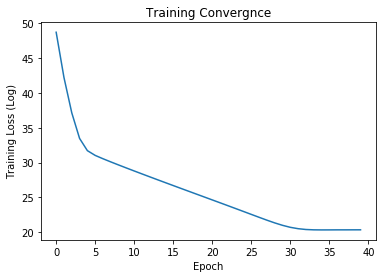

In [7]:
plt.plot(range(epochs), np.log(curve))
plt.xlabel('Epoch')
plt.ylabel('Training Loss (Log)')
plt.title('Training Convergnce')
plt.show()

Test images found:  182
tensor([[5.9646e-07, 4.2003e-07, 9.9394e-07, 4.1473e-04],
        [7.6879e-07, 4.2183e-07, 1.1046e-06, 4.6815e-04],
        [7.7002e-07, 1.5452e-06, 6.1973e-07, 3.7080e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.09deg, Translation Error: 5.0cm

Uncertainty: tensor(0.0013)
Frame index: 1


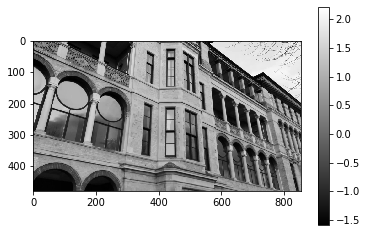

tensor([[5.9646e-07, 4.3927e-07, 9.0485e-07, 3.4056e-04],
        [6.2360e-07, 4.5466e-07, 1.2372e-06, 3.6006e-04],
        [8.0167e-07, 1.6835e-06, 5.9384e-07, 4.1113e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.12deg, Translation Error: 2.5cm

Uncertainty: tensor(0.0011)
Frame index: 2


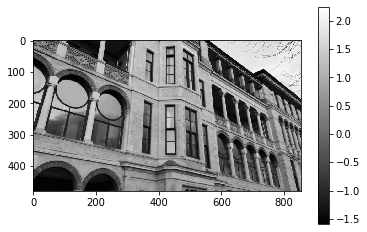

tensor([[7.0528e-07, 3.6518e-07, 1.0636e-06, 5.1738e-04],
        [7.8531e-07, 3.4822e-07, 9.6565e-07, 3.2064e-04],
        [9.4200e-07, 1.5105e-06, 7.3316e-07, 4.1528e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.22deg, Translation Error: 4.2cm

Uncertainty: tensor(0.0013)
Frame index: 3


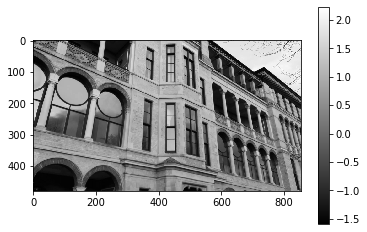

tensor([[3.9830e-07, 7.4465e-07, 5.5769e-07, 2.4060e-04],
        [5.9915e-07, 3.9739e-07, 1.4633e-06, 3.9379e-04],
        [6.2279e-07, 1.5387e-06, 6.1985e-07, 5.7489e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.17deg, Translation Error: 3.5cm

Uncertainty: tensor(0.0012)
Frame index: 4


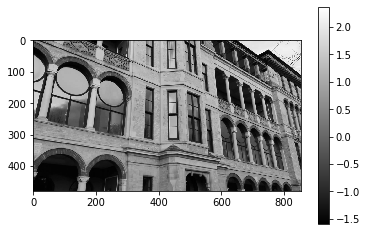

tensor([[4.1681e-07, 7.3052e-07, 1.5260e-06, 4.1953e-04],
        [7.8722e-07, 3.9248e-07, 1.8633e-06, 4.5407e-04],
        [1.2215e-06, 1.7028e-06, 7.2838e-07, 7.0559e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.16deg, Translation Error: 8.4cm

Uncertainty: tensor(0.0016)
Frame index: 5


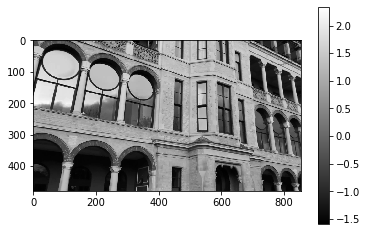

tensor([[3.0471e-07, 5.6103e-07, 1.0722e-06, 4.6679e-04],
        [5.9485e-07, 2.6235e-07, 1.1084e-06, 3.8713e-04],
        [1.1104e-06, 1.1972e-06, 5.4846e-07, 4.0835e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.42deg, Translation Error: 10.5cm

Uncertainty: tensor(0.0013)
Frame index: 6


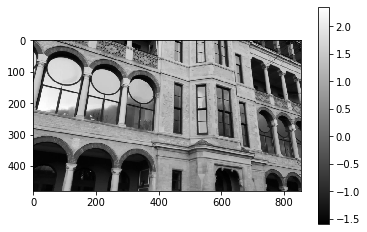

tensor([[3.1520e-07, 1.0168e-06, 1.3172e-06, 3.9113e-04],
        [5.8142e-07, 5.4096e-07, 2.2116e-06, 6.1869e-04],
        [1.4266e-06, 2.0907e-06, 6.0831e-07, 4.6539e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.45deg, Translation Error: 11.6cm

Uncertainty: tensor(0.0015)
Frame index: 7


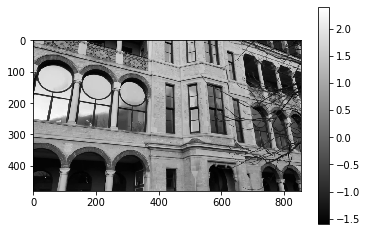

tensor([[1.7779e-07, 6.2721e-07, 9.1356e-07, 2.5754e-04],
        [6.2940e-07, 4.4809e-07, 1.8997e-06, 4.1509e-04],
        [1.0112e-06, 2.0651e-06, 5.5247e-07, 4.9891e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.32deg, Translation Error: 6.4cm

Uncertainty: tensor(0.0012)
Frame index: 8


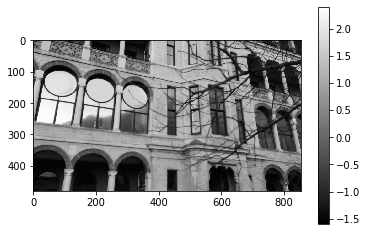

tensor([[2.3105e-07, 7.9870e-07, 1.9702e-06, 5.1410e-04],
        [1.0767e-06, 4.3649e-07, 2.1823e-06, 7.4926e-04],
        [1.8352e-06, 2.2654e-06, 7.3561e-07, 5.6496e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.42deg, Translation Error: 12.2cm

Uncertainty: tensor(0.0018)
Frame index: 9


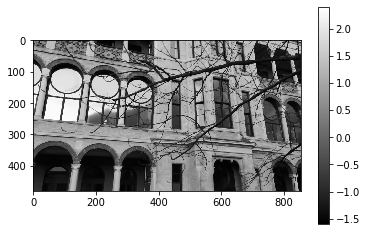

tensor([[1.6699e-07, 5.1298e-07, 1.8593e-06, 4.4848e-04],
        [5.4869e-07, 6.2843e-07, 2.7228e-06, 6.2957e-04],
        [1.6839e-06, 2.6649e-06, 7.0819e-07, 6.4349e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.60deg, Translation Error: 16.3cm

Uncertainty: tensor(0.0017)
Frame index: 10


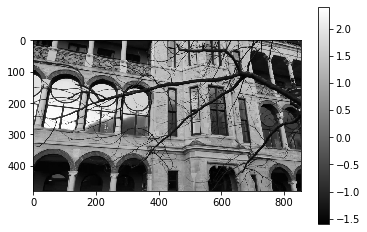

tensor([[6.3360e-08, 7.1428e-07, 1.5274e-06, 5.3368e-04],
        [5.8429e-07, 5.6675e-07, 1.9394e-06, 4.6180e-04],
        [1.5316e-06, 1.8351e-06, 6.1371e-07, 6.5333e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.25deg, Translation Error: 8.4cm

Uncertainty: tensor(0.0017)
Frame index: 11


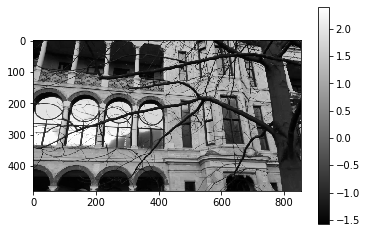

tensor([[2.7166e-07, 5.8973e-07, 4.9683e-06, 1.1161e-03],
        [1.0492e-06, 6.7109e-07, 2.3217e-06, 8.1995e-04],
        [4.4902e-06, 2.3030e-06, 9.3569e-07, 1.1830e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.73deg, Translation Error: 23.1cm

Uncertainty: tensor(0.0031)
Frame index: 12


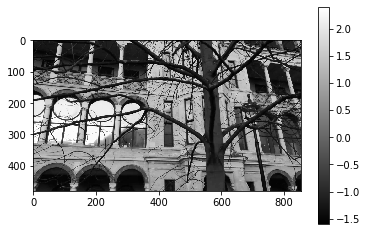

tensor([[1.8303e-08, 6.6521e-07, 1.2986e-06, 4.0130e-04],
        [6.4818e-07, 6.3178e-07, 2.8587e-06, 6.3528e-04],
        [1.3540e-06, 2.8505e-06, 6.9116e-07, 9.5280e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.31deg, Translation Error: 8.7cm

Uncertainty: tensor(0.0020)
Frame index: 13


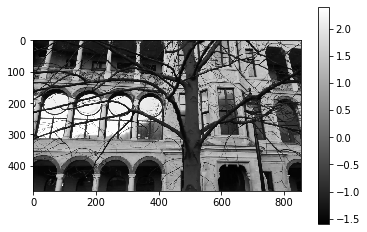

tensor([[5.7597e-08, 6.2572e-07, 1.6579e-06, 4.6456e-04],
        [5.2505e-07, 3.7223e-07, 1.7146e-06, 5.0164e-04],
        [1.7775e-06, 1.7321e-06, 4.8696e-07, 6.0481e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.23deg, Translation Error: 8.4cm

Uncertainty: tensor(0.0016)
Frame index: 14


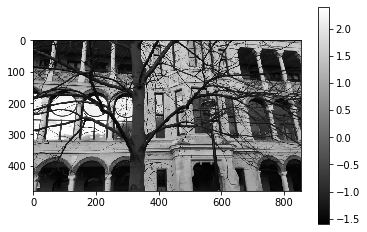

tensor([[1.0771e-08, 5.2763e-07, 1.5789e-06, 5.7565e-04],
        [5.2917e-07, 2.6679e-07, 1.1705e-06, 4.0235e-04],
        [1.5808e-06, 1.1792e-06, 2.8466e-07, 4.1917e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.23deg, Translation Error: 6.1cm

Uncertainty: tensor(0.0014)
Frame index: 15


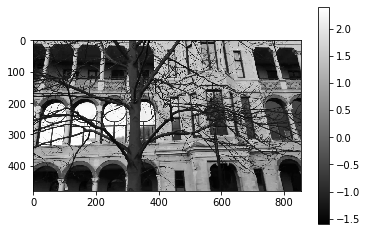

tensor([[4.6059e-09, 9.3328e-07, 2.4396e-06, 6.9027e-04],
        [5.9320e-07, 4.1742e-07, 2.0962e-06, 7.5902e-04],
        [2.7146e-06, 2.1210e-06, 4.5967e-07, 7.9152e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.17deg, Translation Error: 6.2cm

Uncertainty: tensor(0.0023)
Frame index: 16


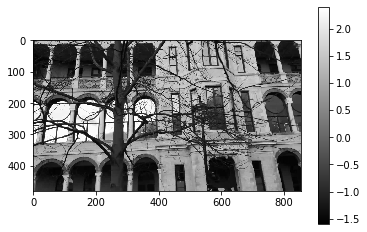

tensor([[1.6363e-09, 6.4097e-07, 1.7559e-06, 6.6319e-04],
        [7.6572e-07, 5.1813e-07, 2.6003e-06, 7.6251e-04],
        [1.6127e-06, 2.6173e-06, 5.1897e-07, 6.4254e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.37deg, Translation Error: 11.0cm

Uncertainty: tensor(0.0021)
Frame index: 17


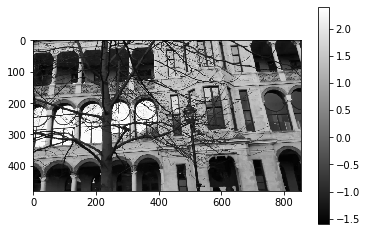

tensor([[7.3497e-10, 6.8067e-07, 2.0393e-06, 8.0003e-04],
        [5.2275e-07, 5.5513e-07, 3.3257e-06, 9.6370e-04],
        [2.2015e-06, 3.3303e-06, 5.5530e-07, 8.1090e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.18deg, Translation Error: 4.6cm

Uncertainty: tensor(0.0026)
Frame index: 18


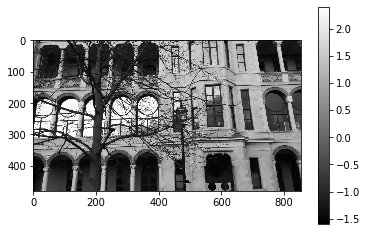

tensor([[1.3089e-08, 6.1675e-07, 1.3291e-06, 5.8056e-04],
        [5.2219e-07, 2.7567e-07, 2.1122e-06, 6.1398e-04],
        [1.4171e-06, 2.1331e-06, 2.7761e-07, 5.5423e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.52deg, Translation Error: 16.6cm

Uncertainty: tensor(0.0018)
Frame index: 19


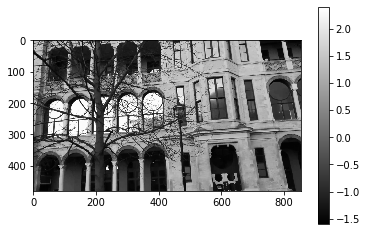

tensor([[1.2433e-08, 5.6974e-07, 2.0809e-06, 8.8878e-04],
        [5.5427e-07, 2.4246e-06, 2.0916e-05, 7.4517e-03],
        [2.2092e-06, 2.1093e-05, 2.3922e-06, 2.0718e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 1.42deg, Translation Error: 50.6cm

Uncertainty: tensor(0.0105)
Frame index: 20


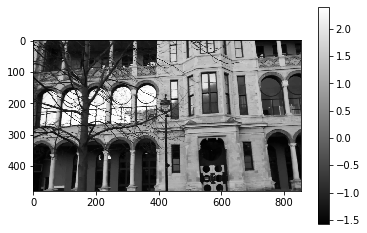

tensor([[4.9451e-08, 4.3210e-07, 3.4760e-06, 1.6902e-03],
        [7.2521e-07, 2.6709e-07, 3.0968e-06, 1.2410e-03],
        [3.2178e-06, 2.9816e-06, 2.1885e-07, 4.4390e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.50deg, Translation Error: 15.7cm

Uncertainty: tensor(0.0034)
Frame index: 21


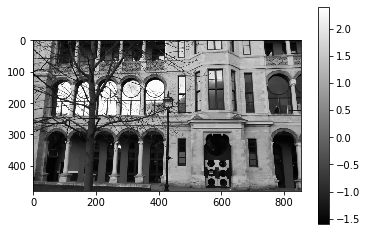

tensor([[5.2078e-08, 4.0945e-07, 3.7750e-06, 1.7041e-03],
        [6.9470e-07, 3.2531e-07, 3.6213e-06, 1.8115e-03],
        [3.5121e-06, 3.7402e-06, 5.0231e-07, 5.7406e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.74deg, Translation Error: 24.5cm

Uncertainty: tensor(0.0041)
Frame index: 22


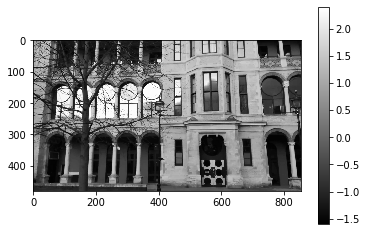

tensor([[1.7945e-08, 7.1337e-07, 1.3837e-06, 6.7478e-04],
        [5.8372e-07, 1.7271e-06, 1.2762e-05, 5.3199e-03],
        [1.4929e-06, 1.2784e-05, 1.7662e-06, 1.7461e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.65deg, Translation Error: 21.8cm

Uncertainty: tensor(0.0078)
Frame index: 23


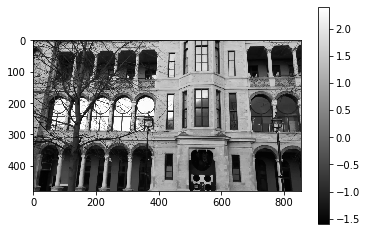

tensor([[3.6830e-08, 5.4353e-07, 1.7780e-06, 9.4170e-04],
        [4.8782e-07, 2.8948e-07, 2.1027e-06, 9.2388e-04],
        [1.8051e-06, 2.0925e-06, 3.3746e-07, 8.0974e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.19deg, Translation Error: 8.8cm

Uncertainty: tensor(0.0027)
Frame index: 24


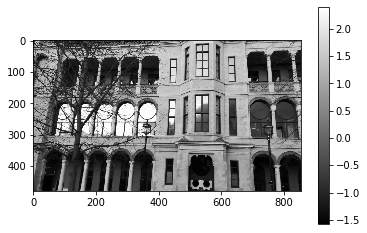

tensor([[1.1514e-08, 5.0355e-07, 1.4919e-06, 7.4126e-04],
        [3.1902e-07, 1.8962e-07, 1.0455e-06, 5.2057e-04],
        [1.6547e-06, 1.0264e-06, 2.0292e-07, 5.3581e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.28deg, Translation Error: 13.6cm

Uncertainty: tensor(0.0018)
Frame index: 25


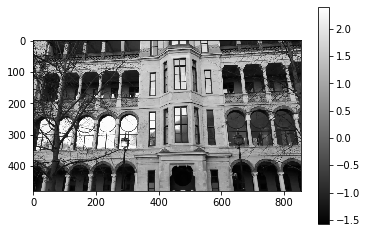

tensor([[6.6711e-08, 5.6468e-07, 1.5066e-06, 9.9196e-04],
        [3.5076e-07, 4.1062e-07, 2.1515e-06, 1.0840e-03],
        [1.6489e-06, 2.0978e-06, 3.7727e-07, 6.9268e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.53deg, Translation Error: 21.9cm

Uncertainty: tensor(0.0028)
Frame index: 26


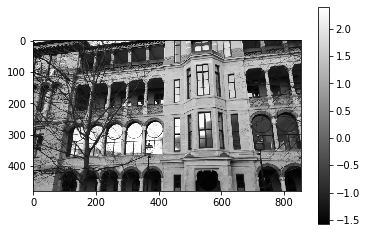

tensor([[2.9624e-08, 4.2295e-07, 1.4131e-06, 9.9798e-04],
        [3.5696e-07, 4.2030e-07, 1.7700e-06, 1.0394e-03],
        [1.5464e-06, 1.7968e-06, 3.9270e-07, 8.9546e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.11deg, Translation Error: 5.5cm

Uncertainty: tensor(0.0029)
Frame index: 27


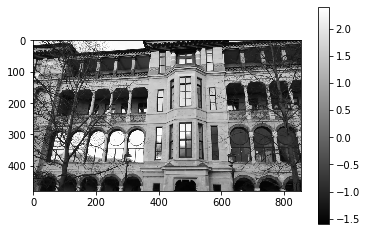

tensor([[5.6237e-08, 4.2747e-07, 1.4883e-06, 8.8629e-04],
        [3.3229e-07, 4.6621e-07, 2.6075e-06, 1.5815e-03],
        [1.5795e-06, 2.5505e-06, 4.2241e-07, 8.0071e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.51deg, Translation Error: 22.1cm

Uncertainty: tensor(0.0033)
Frame index: 28


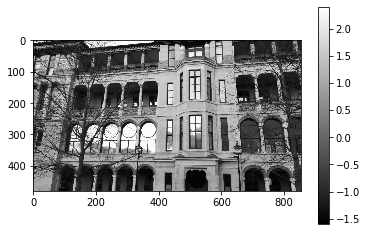

tensor([[1.3127e-07, 7.7448e-07, 1.3982e-06, 1.2128e-03],
        [3.3899e-07, 4.0218e-07, 2.5389e-06, 1.6088e-03],
        [1.6484e-06, 2.3580e-06, 6.0704e-07, 1.0035e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.11deg, Translation Error: 6.6cm

Uncertainty: tensor(0.0038)
Frame index: 29


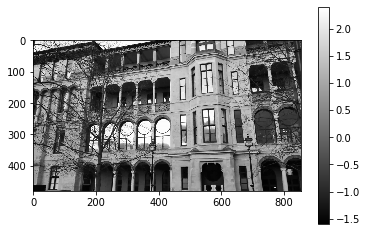

tensor([[2.4094e-07, 4.5562e-07, 2.8518e-06, 2.0107e-03],
        [4.6644e-07, 1.9532e-07, 1.7219e-06, 1.0817e-03],
        [2.7957e-06, 1.6776e-06, 4.3669e-07, 8.4606e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.38deg, Translation Error: 16.7cm

Uncertainty: tensor(0.0039)
Frame index: 30


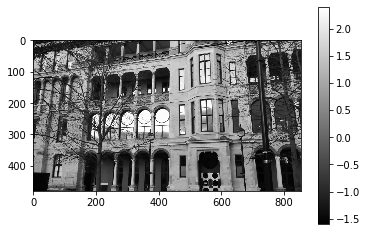

tensor([[2.5543e-07, 6.0676e-07, 2.9890e-06, 2.6354e-03],
        [4.1924e-07, 5.5424e-07, 3.0698e-06, 1.9467e-03],
        [3.1139e-06, 3.0315e-06, 6.0702e-07, 1.1975e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.37deg, Translation Error: 18.6cm

Uncertainty: tensor(0.0058)
Frame index: 31


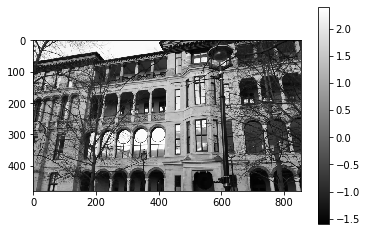

tensor([[1.2716e-07, 4.5719e-07, 1.3690e-06, 9.4956e-04],
        [4.0048e-07, 4.1307e-07, 2.0428e-06, 1.2809e-03],
        [1.4215e-06, 2.0267e-06, 4.7516e-07, 1.1968e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.51deg, Translation Error: 21.4cm

Uncertainty: tensor(0.0034)
Frame index: 32


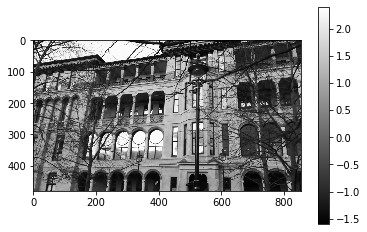

tensor([[1.9002e-07, 8.3422e-07, 1.7462e-06, 1.2454e-03],
        [6.7882e-07, 7.1838e-07, 3.0248e-06, 2.0348e-03],
        [1.7660e-06, 2.9069e-06, 8.5094e-07, 1.1912e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.61deg, Translation Error: 31.9cm

Uncertainty: tensor(0.0045)
Frame index: 33


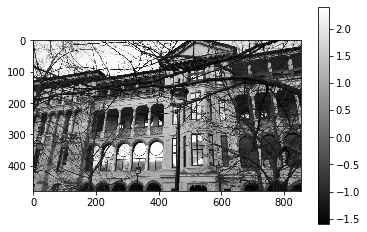

tensor([[3.1899e-07, 8.9684e-07, 1.8084e-06, 1.4452e-03],
        [5.6613e-07, 4.2418e-07, 2.4789e-06, 1.6056e-03],
        [1.9448e-06, 2.3156e-06, 7.9429e-07, 1.4952e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.33deg, Translation Error: 19.0cm

Uncertainty: tensor(0.0046)
Frame index: 34


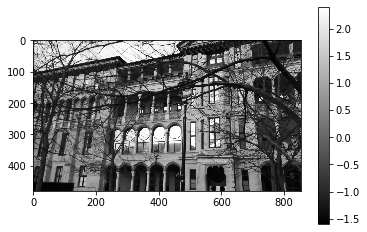

tensor([[1.6435e-07, 6.2413e-07, 1.9695e-06, 1.8268e-03],
        [6.6264e-07, 6.4698e-07, 3.8211e-06, 2.9310e-03],
        [1.8720e-06, 3.8323e-06, 9.4587e-07, 1.8027e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.40deg, Translation Error: 21.9cm

Uncertainty: tensor(0.0066)
Frame index: 35


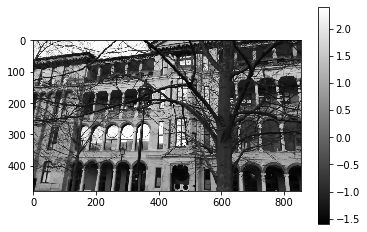

tensor([[1.5150e-07, 5.3132e-07, 1.9487e-06, 1.8133e-03],
        [3.6383e-07, 1.9148e-07, 1.4044e-06, 1.1389e-03],
        [1.8870e-06, 1.2521e-06, 4.1679e-07, 9.4539e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.91deg, Translation Error: 45.3cm

Uncertainty: tensor(0.0039)
Frame index: 36


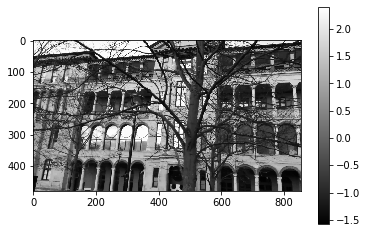

tensor([[1.5599e-07, 5.1098e-07, 2.3852e-06, 2.2971e-03],
        [6.4214e-07, 2.5166e-07, 1.4196e-06, 1.1197e-03],
        [2.3459e-06, 1.4872e-06, 3.7167e-07, 9.6080e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.07deg, Translation Error: 3.4cm

Uncertainty: tensor(0.0044)
Frame index: 37


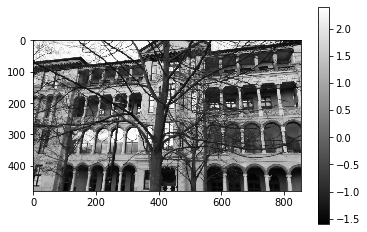

tensor([[1.1766e-07, 6.3282e-07, 1.1730e-06, 1.2904e-03],
        [4.1476e-07, 5.7011e-07, 2.9401e-06, 2.3838e-03],
        [1.2688e-06, 2.7878e-06, 6.4544e-07, 1.3320e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.66deg, Translation Error: 36.0cm

Uncertainty: tensor(0.0050)
Frame index: 38


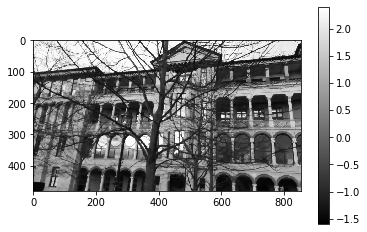

tensor([[2.1302e-07, 2.3520e-07, 1.1627e-06, 1.4685e-03],
        [5.5196e-07, 5.0656e-07, 2.5068e-06, 2.2948e-03],
        [1.1780e-06, 2.7383e-06, 5.5591e-07, 1.4086e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.45deg, Translation Error: 26.0cm

Uncertainty: tensor(0.0052)
Frame index: 39


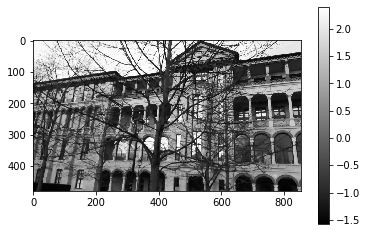

tensor([[2.4698e-07, 5.1428e-07, 1.6094e-06, 2.0522e-03],
        [6.1697e-07, 8.1492e-07, 2.9416e-06, 2.9587e-03],
        [1.6156e-06, 3.0453e-06, 9.5192e-07, 1.8401e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.39deg, Translation Error: 22.3cm

Uncertainty: tensor(0.0069)
Frame index: 40


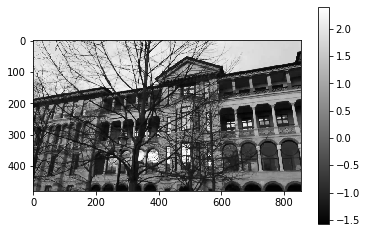

tensor([[3.8440e-07, 7.9707e-07, 1.9719e-06, 2.1884e-03],
        [1.2079e-06, 1.0425e-06, 5.0870e-06, 4.9636e-03],
        [1.7356e-06, 5.2106e-06, 1.5271e-06, 2.9426e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.31deg, Translation Error: 17.8cm

Uncertainty: tensor(0.0101)
Frame index: 41


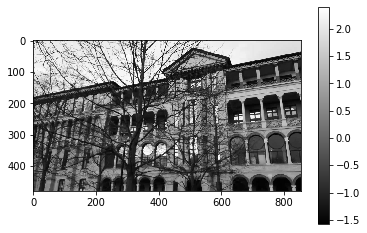

tensor([[2.9167e-07, 5.7698e-07, 1.4573e-06, 1.8486e-03],
        [5.4738e-07, 2.0168e-07, 1.1227e-06, 1.4749e-03],
        [1.6162e-06, 1.2611e-06, 4.7738e-07, 9.5243e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.30deg, Translation Error: 18.4cm

Uncertainty: tensor(0.0043)
Frame index: 42


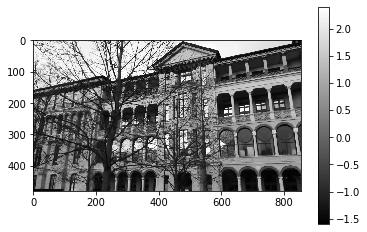

tensor([[4.4063e-07, 6.1690e-07, 2.6658e-06, 2.7570e-03],
        [7.2725e-07, 7.2176e-07, 3.2547e-06, 3.3399e-03],
        [2.5713e-06, 3.2643e-06, 1.2144e-06, 2.5791e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.85deg, Translation Error: 46.1cm

Uncertainty: tensor(0.0087)
Frame index: 43


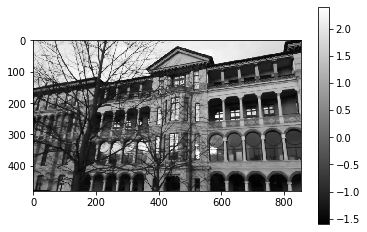

tensor([[1.9849e-07, 4.9389e-07, 1.2646e-06, 1.5336e-03],
        [4.8312e-07, 2.3439e-07, 1.3817e-06, 1.5805e-03],
        [1.2680e-06, 1.3844e-06, 4.0156e-07, 1.1157e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.61deg, Translation Error: 33.5cm

Uncertainty: tensor(0.0042)
Frame index: 44


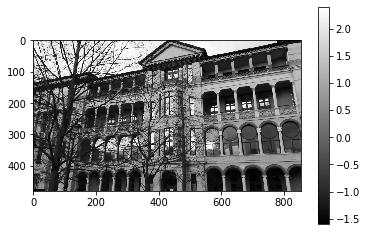

tensor([[5.1209e-07, 4.9726e-07, 1.9969e-06, 2.2488e-03],
        [5.8404e-07, 1.9565e-07, 1.5127e-06, 1.3417e-03],
        [1.8763e-06, 1.5662e-06, 5.6313e-07, 1.0853e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.17deg, Translation Error: 8.3cm

Uncertainty: tensor(0.0047)
Frame index: 45


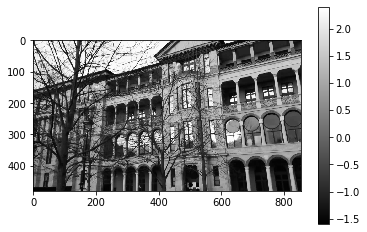

tensor([[2.3718e-07, 5.5273e-07, 1.4168e-06, 1.5140e-03],
        [5.5632e-07, 2.8534e-07, 1.6363e-06, 1.6551e-03],
        [1.3744e-06, 1.5940e-06, 5.3605e-07, 1.1563e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.44deg, Translation Error: 25.8cm

Uncertainty: tensor(0.0043)
Frame index: 46


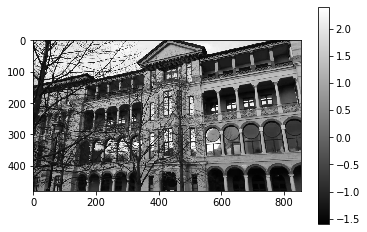

tensor([[3.1072e-07, 5.0812e-07, 1.5463e-06, 1.9478e-03],
        [2.9415e-07, 2.5320e-07, 1.4397e-06, 1.3539e-03],
        [1.4784e-06, 1.2994e-06, 4.3242e-07, 1.0814e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.25deg, Translation Error: 14.2cm

Uncertainty: tensor(0.0044)
Frame index: 47


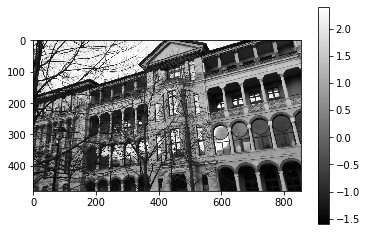

tensor([[2.2726e-07, 5.6566e-07, 1.1130e-06, 1.0915e-03],
        [4.8668e-07, 3.6506e-07, 2.5291e-06, 2.1072e-03],
        [1.0195e-06, 2.4177e-06, 5.1087e-07, 1.2676e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.17deg, Translation Error: 8.1cm

Uncertainty: tensor(0.0045)
Frame index: 48


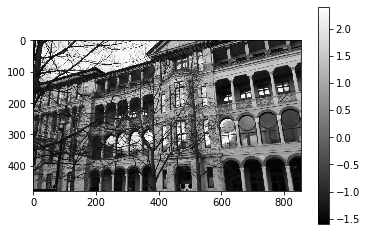

tensor([[5.9725e-07, 3.0384e-07, 3.6866e-06, 3.0381e-03],
        [3.7508e-07, 8.2752e-08, 7.1470e-07, 6.7617e-04],
        [3.5312e-06, 7.7388e-07, 4.8449e-07, 1.3095e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.36deg, Translation Error: 16.6cm

Uncertainty: tensor(0.0050)
Frame index: 49


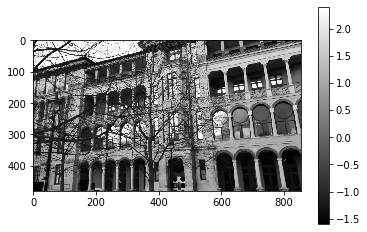

tensor([[6.8901e-07, 5.2010e-07, 2.8702e-06, 2.5905e-03],
        [6.4752e-07, 1.6931e-07, 1.7920e-06, 1.6449e-03],
        [2.7501e-06, 2.0709e-06, 6.0272e-07, 1.2593e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.30deg, Translation Error: 15.1cm

Uncertainty: tensor(0.0055)
Frame index: 50


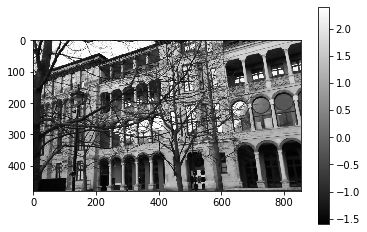

tensor([[7.2866e-07, 4.1134e-07, 2.7088e-06, 2.3364e-03],
        [5.6248e-07, 1.0094e-07, 1.5568e-06, 1.3447e-03],
        [2.6401e-06, 1.6369e-06, 8.3274e-07, 1.6644e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.37deg, Translation Error: 18.1cm

Uncertainty: tensor(0.0054)
Frame index: 51


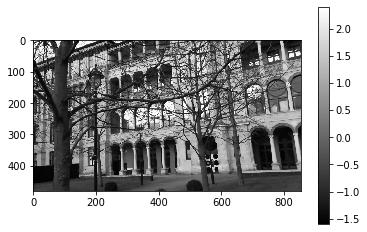

tensor([[1.6294e-06, 7.0361e-07, 6.0542e-06, 4.9068e-03],
        [1.5426e-06, 3.7753e-07, 6.2728e-06, 4.5296e-03],
        [5.4406e-06, 7.6115e-06, 1.2150e-06, 1.7487e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.99deg, Translation Error: 45.1cm

Uncertainty: tensor(0.0112)
Frame index: 52


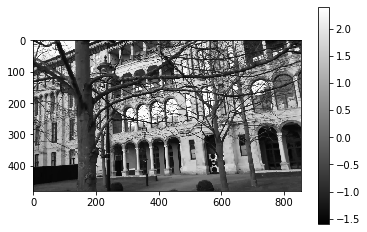

tensor([[1.5146e-06, 8.1630e-07, 4.5421e-06, 3.3508e-03],
        [1.9782e-06, 3.3914e-07, 4.8962e-06, 3.6168e-03],
        [4.2406e-06, 5.9088e-06, 1.7091e-06, 2.7866e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.45deg, Translation Error: 36.6cm

Uncertainty: tensor(0.0098)
Frame index: 53


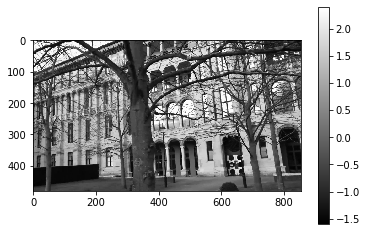

tensor([[8.1836e-07, 8.7867e-07, 2.4933e-06, 1.8406e-03],
        [1.0108e-06, 3.7576e-07, 3.3523e-06, 2.5385e-03],
        [2.5574e-06, 3.5583e-06, 1.1104e-06, 1.9705e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.54deg, Translation Error: 22.6cm

Uncertainty: tensor(0.0064)
Frame index: 54


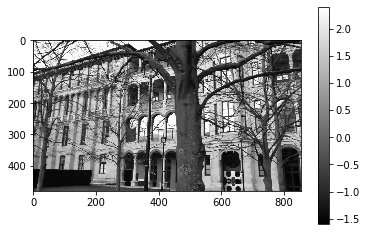

tensor([[8.0389e-07, 6.2856e-07, 3.9766e-06, 3.0447e-03],
        [7.7796e-07, 4.1636e-07, 3.1723e-06, 2.2041e-03],
        [3.9578e-06, 3.3014e-06, 1.1727e-06, 2.1634e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.43deg, Translation Error: 30.6cm

Uncertainty: tensor(0.0074)
Frame index: 55


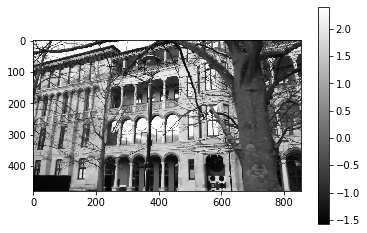

tensor([[2.3682e-07, 7.9450e-07, 2.0899e-06, 1.4193e-03],
        [1.1040e-06, 7.6243e-07, 3.6725e-06, 2.2103e-03],
        [2.1395e-06, 3.6367e-06, 1.3874e-06, 2.7731e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.72deg, Translation Error: 37.8cm

Uncertainty: tensor(0.0064)
Frame index: 56


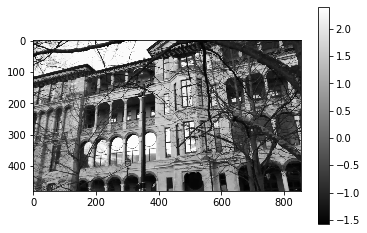

tensor([[1.5610e-09, 5.6889e-07, 2.2778e-06, 3.0681e-03],
        [5.0785e-07, 1.0104e-06, 5.5062e-06, 6.8975e-03],
        [2.3632e-06, 5.4968e-06, 9.9071e-07, 2.2503e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.59deg, Translation Error: 32.4cm

Uncertainty: tensor(0.0122)
Frame index: 57


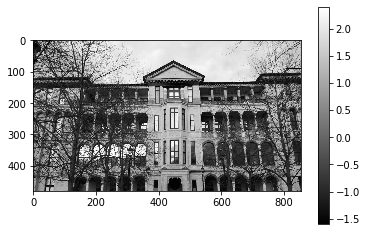

tensor([[3.9818e-09, 5.2921e-07, 5.7068e-06, 8.4826e-03],
        [8.2892e-07, 1.8424e-06, 1.0687e-05, 1.4112e-02],
        [5.5073e-06, 1.0651e-05, 1.7883e-06, 2.3455e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.21deg, Translation Error: 10.9cm

Uncertainty: tensor(0.0250)
Frame index: 58


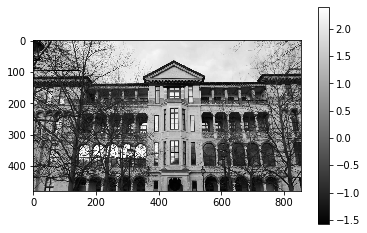

tensor([[3.2621e-09, 4.3435e-07, 5.6431e-06, 8.1110e-03],
        [1.1662e-06, 2.3066e-06, 1.2004e-05, 1.5399e-02],
        [4.8302e-06, 1.2162e-05, 2.3700e-06, 4.4860e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.65deg, Translation Error: 38.4cm

Uncertainty: tensor(0.0280)
Frame index: 59


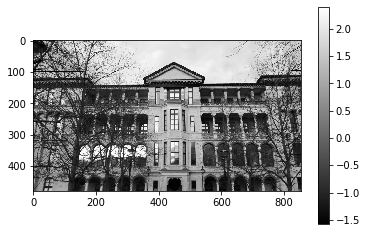

tensor([[1.9357e-08, 1.0030e-06, 1.9846e-05, 3.0301e-02],
        [2.1472e-06, 1.0481e-05, 5.1485e-05, 6.4916e-02],
        [1.6737e-05, 5.3305e-05, 1.0149e-05, 1.9500e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 2.43deg, Translation Error: 145.0cm

Uncertainty: tensor(0.1149)
Frame index: 60


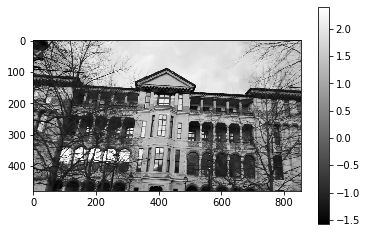

tensor([[2.2910e-07, 6.3780e-07, 3.9317e-06, 6.1074e-03],
        [9.2224e-07, 8.8198e-07, 3.6941e-06, 4.7442e-03],
        [3.9128e-06, 3.8802e-06, 9.3629e-07, 2.6414e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.80deg, Translation Error: 46.1cm

Uncertainty: tensor(0.0135)
Frame index: 61


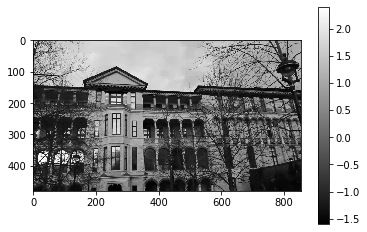

tensor([[1.1463e-07, 7.1094e-07, 2.7730e-06, 3.8051e-03],
        [1.0437e-06, 6.5984e-07, 3.4133e-06, 4.2097e-03],
        [2.5348e-06, 3.6459e-06, 8.3787e-07, 2.9052e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.21deg, Translation Error: 11.4cm

Uncertainty: tensor(0.0109)
Frame index: 62


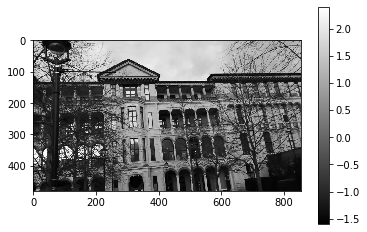

tensor([[3.1323e-07, 8.6625e-07, 4.6978e-06, 7.4798e-03],
        [7.4566e-07, 6.0902e-07, 3.0098e-06, 3.8361e-03],
        [4.6670e-06, 3.0094e-06, 9.9403e-07, 1.7314e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 1.39deg, Translation Error: 88.4cm

Uncertainty: tensor(0.0131)
Frame index: 63


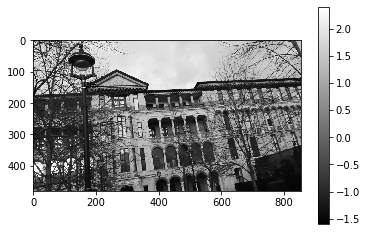

tensor([[5.7862e-07, 1.2693e-06, 5.8407e-06, 7.9658e-03],
        [1.7634e-06, 3.5623e-06, 1.2261e-05, 1.5547e-02],
        [4.5604e-06, 1.3055e-05, 4.7947e-06, 1.2344e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.65deg, Translation Error: 37.5cm

Uncertainty: tensor(0.0359)
Frame index: 64


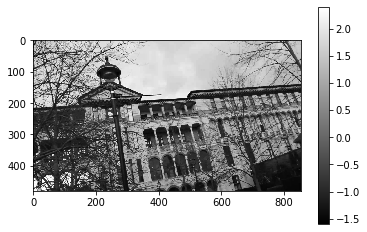

tensor([[1.4142e-06, 1.3578e-06, 1.3777e-05, 2.1866e-02],
        [1.6226e-06, 1.4996e-06, 5.1382e-06, 7.6902e-03],
        [1.3685e-05, 4.9209e-06, 2.6161e-06, 5.7926e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.44deg, Translation Error: 34.6cm

Uncertainty: tensor(0.0354)
Frame index: 65


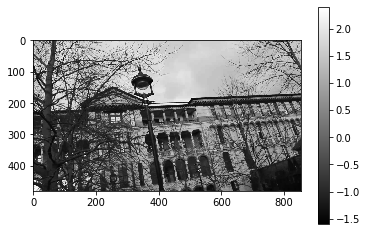

tensor([[3.9822e-07, 1.0672e-06, 3.5125e-06, 5.4429e-03],
        [7.9127e-07, 1.0243e-06, 3.9700e-06, 5.7519e-03],
        [3.7259e-06, 4.0395e-06, 1.5081e-06, 3.3236e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.44deg, Translation Error: 23.6cm

Uncertainty: tensor(0.0145)
Frame index: 66


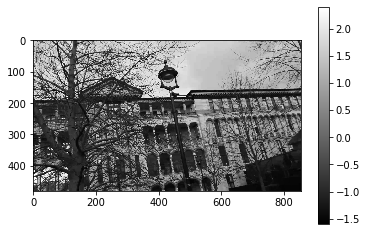

tensor([[1.7624e-06, 7.0663e-07, 1.5656e-05, 2.8768e-02],
        [2.2177e-06, 2.5786e-06, 9.3036e-06, 1.4927e-02],
        [1.4802e-05, 9.3023e-06, 3.2802e-06, 5.8309e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.17deg, Translation Error: 8.6cm

Uncertainty: tensor(0.0496)
Frame index: 67


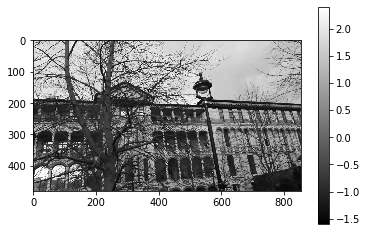

tensor([[1.5500e-06, 1.8402e-06, 1.5214e-05, 2.6817e-02],
        [6.0637e-06, 1.4256e-05, 4.9916e-05, 8.2809e-02],
        [1.3143e-05, 5.3182e-05, 1.8515e-05, 2.8450e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 1.00deg, Translation Error: 76.6cm

Uncertainty: tensor(0.1383)
Frame index: 68


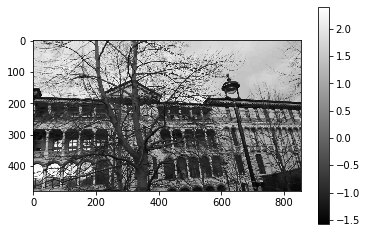

tensor([[9.2104e-07, 1.0608e-06, 1.2148e-05, 2.0652e-02],
        [9.9712e-06, 2.0208e-05, 6.1398e-05, 9.9683e-02],
        [7.2693e-06, 6.8268e-05, 2.6849e-05, 3.6042e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 2.13deg, Translation Error: 152.7cm

Uncertainty: tensor(0.1566)
Frame index: 69


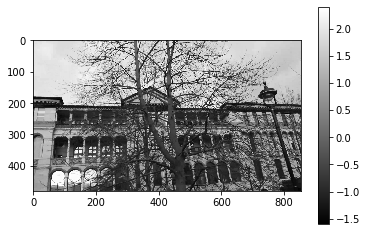

tensor([[5.7967e-07, 1.0844e-06, 6.3923e-06, 1.0987e-02],
        [3.0017e-06, 7.5092e-06, 2.7684e-05, 4.4210e-02],
        [5.5654e-06, 2.9779e-05, 9.3357e-06, 1.6150e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.15deg, Translation Error: 2.9cm

Uncertainty: tensor(0.0714)
Frame index: 70


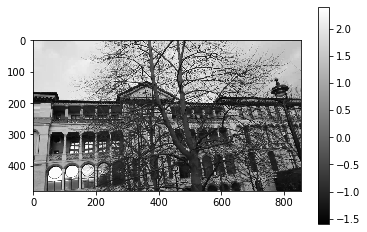

tensor([[1.4584e-06, 1.4578e-06, 1.9051e-05, 3.2968e-02],
        [5.5910e-06, 1.7447e-05, 5.4008e-05, 9.0042e-02],
        [1.7939e-05, 5.7145e-05, 1.8941e-05, 2.1726e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.61deg, Translation Error: 39.9cm

Uncertainty: tensor(0.1449)
Frame index: 71


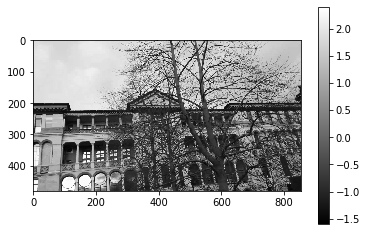

tensor([[4.6026e-07, 7.7641e-07, 4.8055e-06, 7.7059e-03],
        [2.1301e-06, 4.3351e-06, 1.6616e-05, 2.6912e-02],
        [4.3654e-06, 1.7824e-05, 5.5088e-06, 8.8520e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.75deg, Translation Error: 49.4cm

Uncertainty: tensor(0.0435)
Frame index: 72


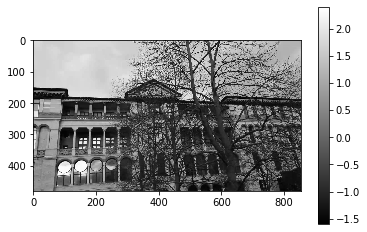

tensor([[6.1196e-07, 1.0960e-06, 1.0282e-05, 1.6447e-02],
        [2.9031e-06, 5.1063e-06, 1.4247e-05, 2.1586e-02],
        [7.1135e-06, 1.7409e-05, 7.2044e-06, 1.2655e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.45deg, Translation Error: 27.6cm

Uncertainty: tensor(0.0508)
Frame index: 73


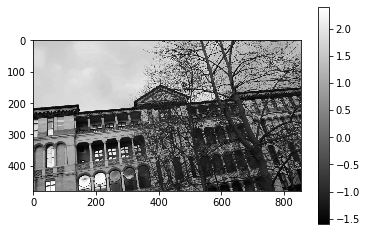

tensor([[1.2172e-06, 1.0736e-06, 1.4962e-05, 2.6126e-02],
        [2.8450e-06, 8.7576e-06, 3.0093e-05, 5.1415e-02],
        [1.5667e-05, 3.0220e-05, 8.4890e-06, 1.3286e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.97deg, Translation Error: 67.0cm

Uncertainty: tensor(0.0909)
Frame index: 74


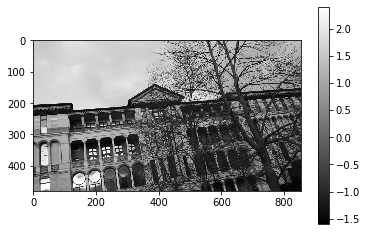

tensor([[2.7890e-07, 9.6708e-07, 7.3811e-06, 1.1147e-02],
        [1.3287e-06, 5.5619e-06, 1.9398e-05, 3.3274e-02],
        [7.1297e-06, 1.9161e-05, 5.6763e-06, 9.1929e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 1.27deg, Translation Error: 80.9cm

Uncertainty: tensor(0.0537)
Frame index: 75


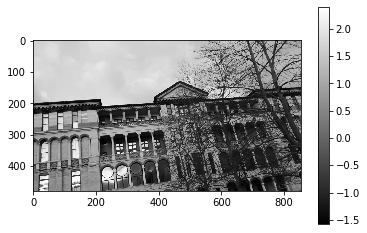

tensor([[1.1302e-06, 1.0076e-06, 1.7316e-05, 2.8347e-02],
        [3.7885e-06, 4.8089e-06, 1.6182e-05, 2.5360e-02],
        [1.3657e-05, 1.9148e-05, 7.6669e-06, 1.8478e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.47deg, Translation Error: 36.9cm

Uncertainty: tensor(0.0723)
Frame index: 76


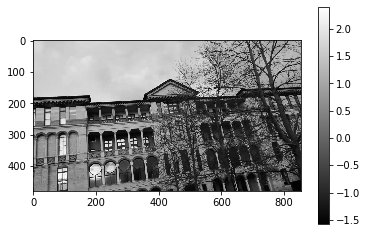

tensor([[4.0234e-07, 5.8298e-07, 6.3253e-06, 9.4467e-03],
        [1.5817e-06, 4.3368e-06, 1.8038e-05, 3.0518e-02],
        [6.7079e-06, 1.7825e-05, 3.8780e-06, 7.4220e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.79deg, Translation Error: 48.7cm

Uncertainty: tensor(0.0474)
Frame index: 77


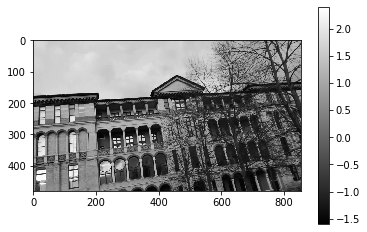

tensor([[2.9447e-07, 5.0568e-07, 4.9059e-06, 7.3194e-03],
        [1.4808e-06, 2.7601e-06, 1.1991e-05, 1.9293e-02],
        [3.9355e-06, 1.2881e-05, 3.5074e-06, 9.3744e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.20deg, Translation Error: 19.2cm

Uncertainty: tensor(0.0360)
Frame index: 78


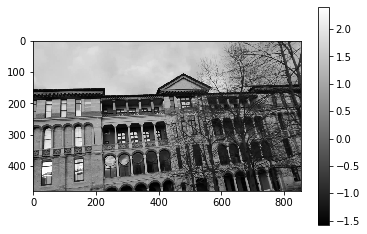

tensor([[3.7944e-07, 7.7514e-07, 1.3000e-05, 2.0221e-02],
        [1.3499e-06, 8.1884e-06, 3.8453e-05, 6.9955e-02],
        [1.5227e-05, 3.5155e-05, 6.9962e-06, 1.0559e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 1.21deg, Translation Error: 76.9cm

Uncertainty: tensor(0.1009)
Frame index: 79


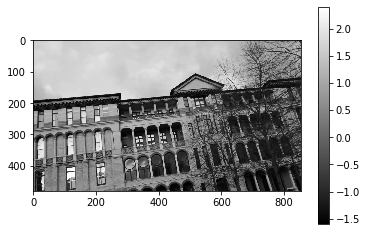

tensor([[1.6406e-06, 7.1475e-07, 1.0014e-05, 1.8402e-02],
        [2.5799e-06, 4.2983e-06, 2.3236e-05, 4.3834e-02],
        [1.1731e-05, 2.4917e-05, 3.9036e-06, 9.4513e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 1.24deg, Translation Error: 86.3cm

Uncertainty: tensor(0.0718)
Frame index: 80


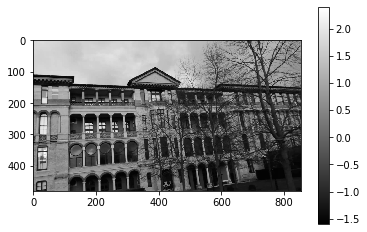

tensor([[6.8856e-07, 8.6689e-07, 6.5452e-06, 1.0841e-02],
        [1.9014e-06, 1.2839e-06, 5.9737e-06, 9.7540e-03],
        [5.8457e-06, 6.7097e-06, 2.8385e-06, 8.8970e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 2.32deg, Translation Error: 158.1cm

Uncertainty: tensor(0.0295)
Frame index: 81


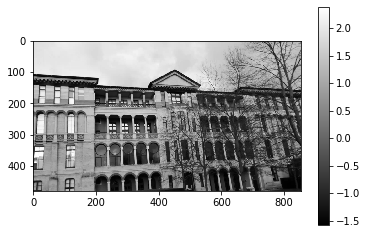

tensor([[1.3601e-06, 8.3129e-07, 2.4697e-05, 3.9856e-02],
        [3.2782e-06, 7.3454e-06, 4.0779e-05, 7.8862e-02],
        [2.3840e-05, 4.1397e-05, 7.4888e-06, 2.3961e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.82deg, Translation Error: 60.4cm

Uncertainty: tensor(0.1428)
Frame index: 82


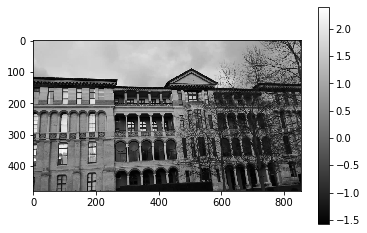

tensor([[6.8272e-07, 4.0003e-07, 5.8541e-06, 1.0821e-02],
        [1.1539e-06, 1.3286e-06, 1.2092e-05, 2.4111e-02],
        [6.4389e-06, 1.2455e-05, 1.1635e-06, 5.3151e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 1.63deg, Translation Error: 112.9cm

Uncertainty: tensor(0.0403)
Frame index: 83


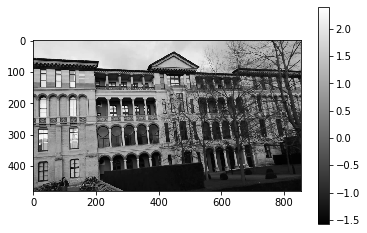

tensor([[4.6670e-07, 6.8460e-07, 1.4078e-05, 2.5218e-02],
        [1.1713e-06, 4.6701e-06, 2.2477e-05, 5.0759e-02],
        [1.7490e-05, 1.8688e-05, 3.1463e-06, 6.2900e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 1.72deg, Translation Error: 120.9cm

Uncertainty: tensor(0.0823)
Frame index: 84


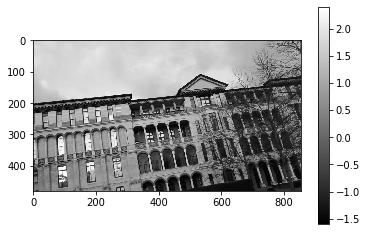

tensor([[2.6785e-08, 9.4994e-07, 6.5496e-06, 1.2014e-02],
        [1.3250e-06, 6.1830e-07, 3.8070e-06, 8.0988e-03],
        [6.8398e-06, 3.4032e-06, 8.2092e-07, 3.3800e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 1.02deg, Translation Error: 67.8cm

Uncertainty: tensor(0.0235)
Frame index: 85


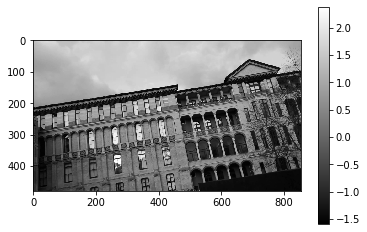

tensor([[5.6098e-08, 1.2581e-06, 2.7933e-05, 5.0665e-02],
        [3.5687e-06, 1.5614e-06, 1.0320e-05, 2.4875e-02],
        [2.8257e-05, 8.3311e-06, 2.2037e-06, 6.7952e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.96deg, Translation Error: 68.9cm

Uncertainty: tensor(0.0824)
Frame index: 86


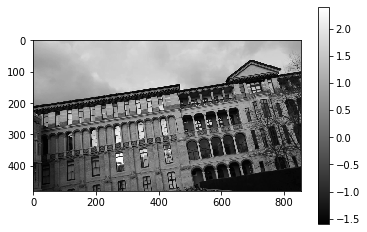

tensor([[3.8276e-07, 1.2445e-06, 2.5028e-05, 4.4485e-02],
        [1.4591e-06, 2.1076e-06, 1.3709e-05, 3.0724e-02],
        [2.6658e-05, 1.2027e-05, 1.6753e-06, 1.7397e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 1.22deg, Translation Error: 108.2cm

Uncertainty: tensor(0.0927)
Frame index: 87


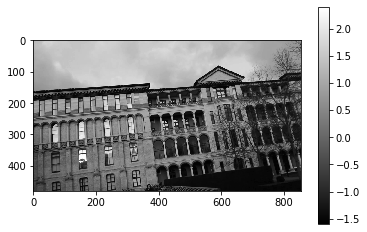

tensor([[3.5620e-07, 6.5181e-07, 7.6798e-06, 1.3282e-02],
        [1.2009e-06, 5.8484e-06, 3.5413e-05, 8.1466e-02],
        [8.6011e-06, 3.5225e-05, 5.1279e-06, 1.3110e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 1.67deg, Translation Error: 137.6cm

Uncertainty: tensor(0.1080)
Frame index: 88


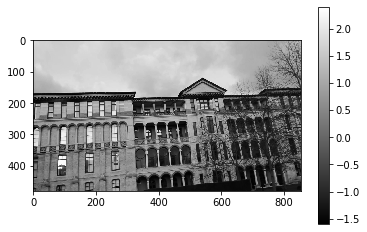

tensor([[1.7779e-06, 1.7181e-06, 2.8545e-05, 5.4041e-02],
        [3.1719e-06, 1.5655e-06, 6.7166e-06, 1.0948e-02],
        [2.5152e-05, 9.1299e-06, 6.1231e-06, 4.2754e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.50deg, Translation Error: 42.1cm

Uncertainty: tensor(0.1078)
Frame index: 89


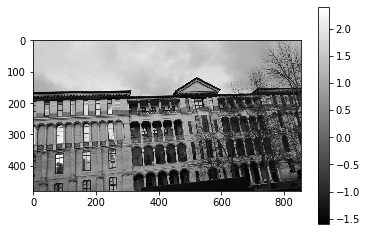

tensor([[5.9655e-07, 1.1217e-06, 3.4719e-06, 6.8107e-03],
        [1.8318e-06, 2.0108e-06, 8.6334e-06, 1.9931e-02],
        [2.7098e-06, 1.0031e-05, 3.7804e-06, 1.3324e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 1.15deg, Translation Error: 84.6cm

Uncertainty: tensor(0.0401)
Frame index: 90


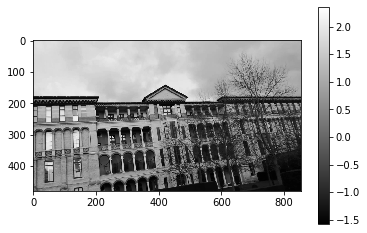

tensor([[7.1078e-07, 4.7718e-07, 2.8346e-06, 6.5987e-03],
        [4.9871e-07, 4.8977e-07, 2.8576e-06, 8.0350e-03],
        [3.5064e-06, 2.2795e-06, 3.4602e-07, 2.7652e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.59deg, Translation Error: 43.4cm

Uncertainty: tensor(0.0174)
Frame index: 91


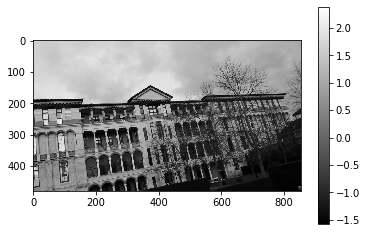

tensor([[2.0724e-06, 1.1323e-06, 7.7162e-06, 1.7443e-02],
        [1.8594e-06, 1.3512e-06, 6.0392e-06, 1.5364e-02],
        [7.8236e-06, 6.6957e-06, 3.2445e-06, 1.2173e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.70deg, Translation Error: 54.8cm

Uncertainty: tensor(0.0450)
Frame index: 92


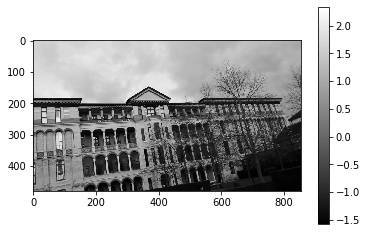

tensor([[3.0927e-06, 7.1170e-07, 1.6678e-05, 3.3198e-02],
        [5.0906e-06, 1.4586e-06, 1.0194e-05, 2.0746e-02],
        [1.3950e-05, 1.3172e-05, 7.2942e-06, 3.1671e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 1.12deg, Translation Error: 89.2cm

Uncertainty: tensor(0.0857)
Frame index: 93


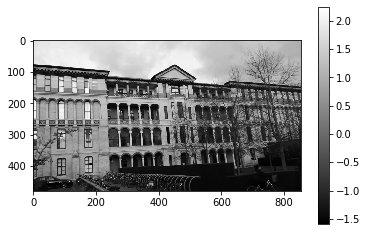

tensor([[2.1592e-06, 6.0690e-07, 1.6197e-05, 2.6397e-02],
        [4.7723e-06, 1.3961e-06, 1.6124e-05, 3.1006e-02],
        [1.3192e-05, 1.9503e-05, 4.6985e-06, 4.5137e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.26deg, Translation Error: 30.8cm

Uncertainty: tensor(0.1026)
Frame index: 94


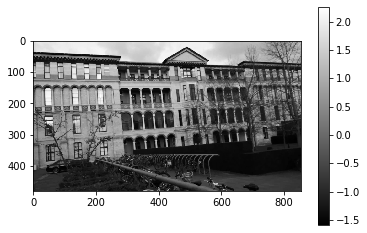

tensor([[3.7832e-07, 5.7025e-07, 3.8565e-06, 7.5801e-03],
        [7.2895e-07, 2.6929e-07, 5.8352e-06, 1.2362e-02],
        [3.5804e-06, 5.9324e-06, 6.8144e-07, 8.9672e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 1.36deg, Translation Error: 120.4cm

Uncertainty: tensor(0.0289)
Frame index: 95


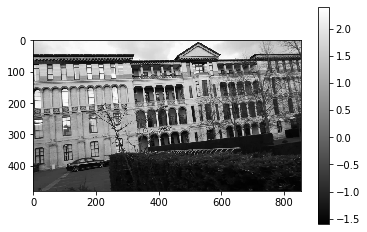

tensor([[8.7853e-07, 4.3909e-07, 3.5543e-06, 7.0410e-03],
        [1.0707e-06, 4.8887e-07, 2.9144e-06, 6.5244e-03],
        [3.3083e-06, 3.1242e-06, 1.0946e-06, 9.4258e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.63deg, Translation Error: 55.3cm

Uncertainty: tensor(0.0230)
Frame index: 96


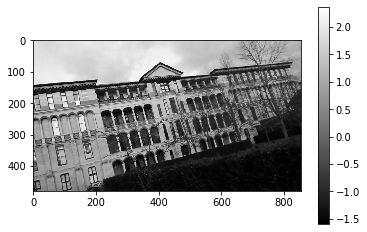

tensor([[6.4209e-07, 5.5337e-07, 1.5239e-06, 4.4638e-03],
        [1.5503e-06, 1.0779e-06, 6.8439e-06, 1.6808e-02],
        [2.3277e-06, 7.7206e-06, 1.0527e-06, 6.5541e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.35deg, Translation Error: 27.6cm

Uncertainty: tensor(0.0278)
Frame index: 97


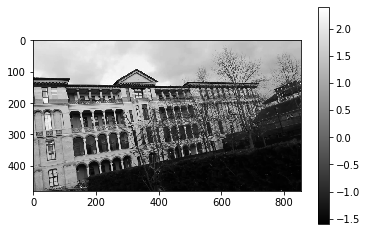

tensor([[1.0873e-06, 7.0148e-07, 1.8502e-06, 5.5427e-03],
        [6.4204e-07, 4.5967e-07, 2.8295e-06, 8.1903e-03],
        [2.4157e-06, 2.7272e-06, 8.6939e-07, 3.6923e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.85deg, Translation Error: 72.2cm

Uncertainty: tensor(0.0174)
Frame index: 98


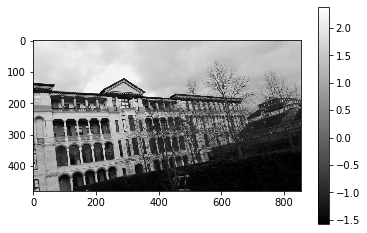

tensor([[1.4784e-06, 6.3368e-07, 2.9084e-06, 6.7889e-03],
        [8.6310e-07, 3.6036e-07, 2.3015e-06, 6.8243e-03],
        [3.3412e-06, 2.7293e-06, 1.4098e-06, 6.9353e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.86deg, Translation Error: 63.5cm

Uncertainty: tensor(0.0206)
Frame index: 99


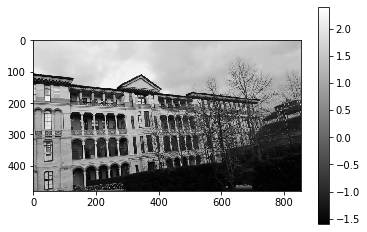

tensor([[2.0960e-06, 6.4625e-07, 2.6516e-06, 6.6251e-03],
        [3.0800e-06, 8.1517e-07, 4.4795e-06, 1.3441e-02],
        [3.0229e-06, 7.1605e-06, 2.7446e-06, 9.0098e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.85deg, Translation Error: 74.4cm

Uncertainty: tensor(0.0291)
Frame index: 100


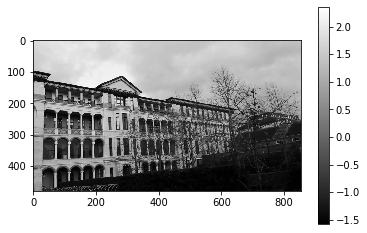

tensor([[2.0755e-06, 6.5874e-07, 3.6997e-06, 8.3088e-03],
        [4.0567e-06, 1.2655e-06, 7.5487e-06, 2.1621e-02],
        [3.6497e-06, 1.0687e-05, 3.5600e-06, 1.1250e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.32deg, Translation Error: 21.1cm

Uncertainty: tensor(0.0412)
Frame index: 101


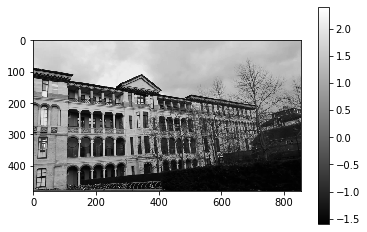

tensor([[2.6879e-06, 6.7206e-07, 3.6551e-06, 8.6901e-03],
        [3.2389e-06, 1.0889e-06, 6.6503e-06, 1.8731e-02],
        [3.4497e-06, 8.7632e-06, 3.7603e-06, 1.3513e-02],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.36deg, Translation Error: 31.8cm

Uncertainty: tensor(0.0410)
Frame index: 102


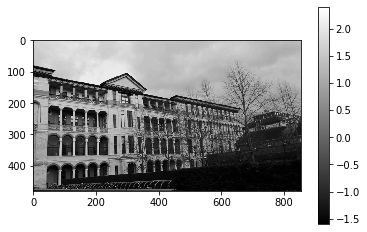

tensor([[7.8806e-07, 6.2692e-07, 1.6172e-06, 4.0404e-03],
        [4.3047e-06, 1.4712e-06, 1.1819e-05, 2.8559e-02],
        [1.7663e-06, 1.5560e-05, 1.7978e-06, 9.5995e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.77deg, Translation Error: 61.1cm

Uncertainty: tensor(0.0422)
Frame index: 103


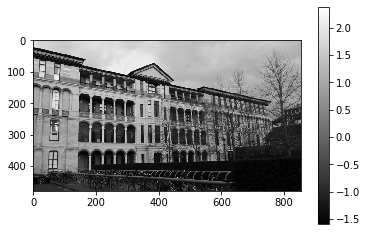

tensor([[9.9934e-07, 3.2268e-07, 2.8521e-06, 4.4982e-03],
        [1.3020e-06, 2.0013e-07, 2.4582e-06, 4.8781e-03],
        [2.5578e-06, 3.0169e-06, 1.4267e-06, 9.8478e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.29deg, Translation Error: 20.9cm

Uncertainty: tensor(0.0192)
Frame index: 104


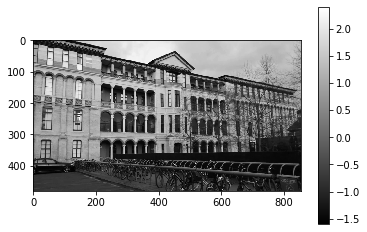

tensor([[7.5594e-07, 6.3239e-07, 3.3175e-06, 5.5562e-03],
        [6.9106e-07, 1.4823e-07, 2.5505e-06, 5.2508e-03],
        [3.1188e-06, 2.3811e-06, 9.4778e-07, 5.7673e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.16deg, Translation Error: 12.2cm

Uncertainty: tensor(0.0166)
Frame index: 105


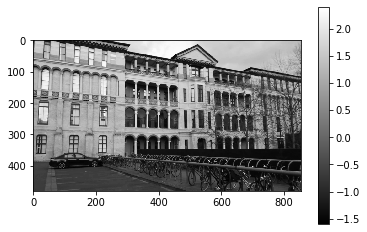

tensor([[4.7249e-07, 6.3399e-07, 1.9361e-06, 3.4083e-03],
        [7.3760e-07, 2.2703e-07, 3.0478e-06, 6.1053e-03],
        [1.8178e-06, 2.9861e-06, 8.4904e-07, 4.4824e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.17deg, Translation Error: 17.1cm

Uncertainty: tensor(0.0140)
Frame index: 106


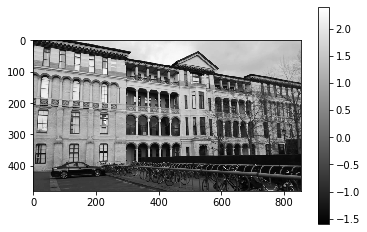

tensor([[9.8978e-07, 5.8453e-07, 3.4900e-06, 4.6650e-03],
        [1.5518e-06, 2.8001e-07, 2.6783e-06, 5.0934e-03],
        [3.1345e-06, 3.2862e-06, 1.5135e-06, 8.6402e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.67deg, Translation Error: 44.3cm

Uncertainty: tensor(0.0184)
Frame index: 107


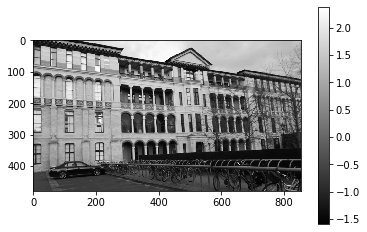

tensor([[5.4082e-07, 4.8731e-07, 1.5542e-06, 2.9033e-03],
        [9.0213e-07, 1.8719e-07, 2.3553e-06, 4.6316e-03],
        [1.4351e-06, 2.6280e-06, 8.4857e-07, 4.2119e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.34deg, Translation Error: 28.7cm

Uncertainty: tensor(0.0118)
Frame index: 108


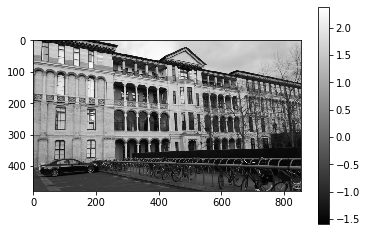

tensor([[4.8030e-07, 8.1606e-07, 1.9575e-06, 3.5997e-03],
        [5.3001e-07, 2.5258e-07, 4.1533e-06, 6.5241e-03],
        [2.0036e-06, 3.9612e-06, 7.8338e-07, 5.5066e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.57deg, Translation Error: 39.9cm

Uncertainty: tensor(0.0156)
Frame index: 109


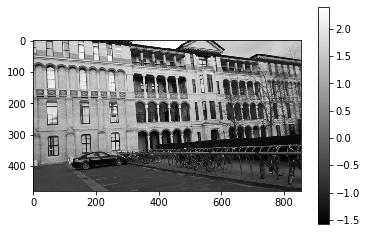

tensor([[2.3666e-07, 7.8772e-07, 1.4056e-06, 2.0966e-03],
        [5.1521e-07, 1.8068e-07, 3.4400e-06, 6.6868e-03],
        [1.3199e-06, 3.0964e-06, 4.5046e-07, 3.5696e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 1.07deg, Translation Error: 72.0cm

Uncertainty: tensor(0.0124)
Frame index: 110


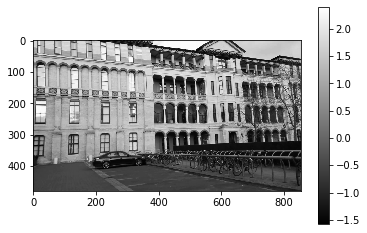

tensor([[2.4812e-07, 1.0052e-06, 1.2698e-06, 2.7467e-03],
        [6.7332e-07, 3.5514e-07, 3.4430e-06, 7.2317e-03],
        [1.3634e-06, 3.1500e-06, 5.1476e-07, 3.3491e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 1.30deg, Translation Error: 89.1cm

Uncertainty: tensor(0.0133)
Frame index: 111


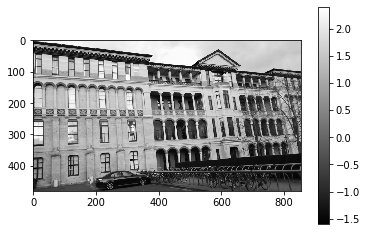

tensor([[2.3237e-07, 6.7963e-07, 8.7529e-07, 1.9837e-03],
        [5.4358e-07, 1.2015e-07, 1.4362e-06, 3.1571e-03],
        [8.3606e-07, 1.2469e-06, 3.2194e-07, 1.9533e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.49deg, Translation Error: 29.3cm

Uncertainty: tensor(0.0071)
Frame index: 112


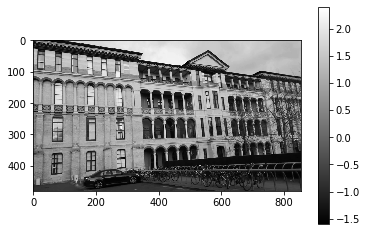

tensor([[4.9513e-07, 5.3860e-07, 1.5379e-06, 2.5022e-03],
        [1.0811e-06, 2.1610e-07, 2.2442e-06, 3.8500e-03],
        [1.2757e-06, 2.4748e-06, 7.4075e-07, 3.8670e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.45deg, Translation Error: 37.2cm

Uncertainty: tensor(0.0102)
Frame index: 113


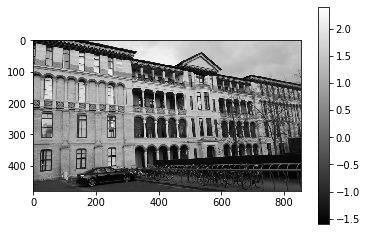

tensor([[3.3897e-07, 7.1608e-07, 1.0022e-06, 2.1572e-03],
        [8.5651e-07, 2.6068e-07, 3.0574e-06, 5.3032e-03],
        [9.9870e-07, 3.1914e-06, 6.1494e-07, 3.0700e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.38deg, Translation Error: 27.7cm

Uncertainty: tensor(0.0105)
Frame index: 114


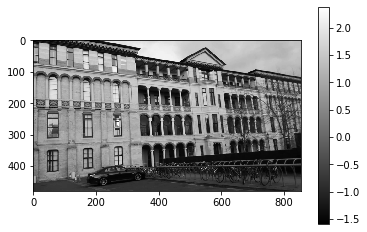

tensor([[6.6178e-07, 5.7114e-07, 1.2887e-06, 2.5339e-03],
        [5.2589e-07, 7.4231e-08, 1.5469e-06, 2.7696e-03],
        [1.2909e-06, 1.4612e-06, 6.4812e-07, 2.6045e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.34deg, Translation Error: 18.8cm

Uncertainty: tensor(0.0079)
Frame index: 115


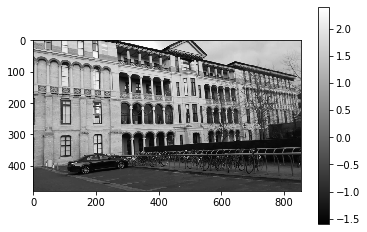

tensor([[5.5397e-07, 5.0616e-07, 1.2827e-06, 2.3286e-03],
        [9.5301e-07, 2.0133e-07, 1.9529e-06, 3.7284e-03],
        [1.0693e-06, 2.1472e-06, 6.9167e-07, 2.8611e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.68deg, Translation Error: 48.8cm

Uncertainty: tensor(0.0089)
Frame index: 116


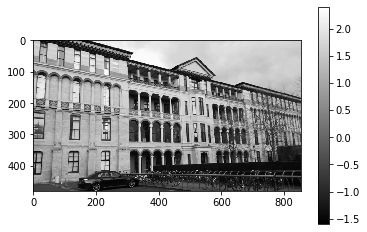

tensor([[5.0504e-07, 7.3193e-07, 1.2033e-06, 1.9807e-03],
        [7.3251e-07, 1.9289e-07, 2.7414e-06, 4.8473e-03],
        [1.0924e-06, 2.6316e-06, 7.4290e-07, 3.6918e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.32deg, Translation Error: 16.8cm

Uncertainty: tensor(0.0105)
Frame index: 117


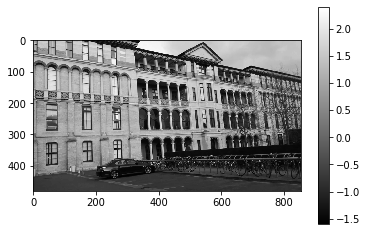

tensor([[3.4062e-07, 7.1992e-07, 9.1324e-07, 1.6013e-03],
        [8.8888e-07, 1.6348e-07, 1.7479e-06, 3.3134e-03],
        [8.1192e-07, 1.8027e-06, 5.8568e-07, 3.8011e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.43deg, Translation Error: 28.9cm

Uncertainty: tensor(0.0087)
Frame index: 118


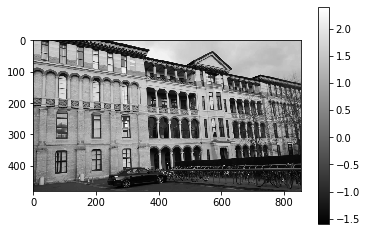

tensor([[4.3573e-07, 5.3332e-07, 1.2854e-06, 2.7136e-03],
        [7.1643e-07, 1.7081e-07, 1.9917e-06, 3.3646e-03],
        [1.2228e-06, 2.1135e-06, 5.7198e-07, 2.3191e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.43deg, Translation Error: 44.4cm

Uncertainty: tensor(0.0084)
Frame index: 119


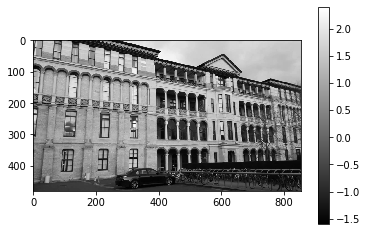

tensor([[4.3693e-07, 6.8320e-07, 1.1288e-06, 1.9664e-03],
        [6.2929e-07, 2.4023e-07, 1.8488e-06, 3.9356e-03],
        [1.1466e-06, 1.8223e-06, 7.4984e-07, 3.0235e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.54deg, Translation Error: 33.5cm

Uncertainty: tensor(0.0089)
Frame index: 120


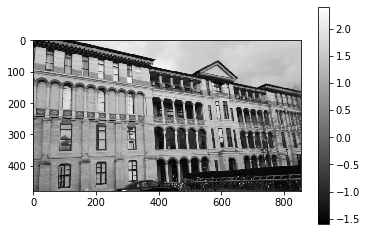

tensor([[1.0729e-06, 6.6558e-07, 2.2241e-06, 2.3309e-03],
        [8.7841e-07, 2.7894e-07, 1.8745e-06, 3.6699e-03],
        [2.0559e-06, 1.8776e-06, 1.3929e-06, 6.6637e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.38deg, Translation Error: 21.6cm

Uncertainty: tensor(0.0127)
Frame index: 121


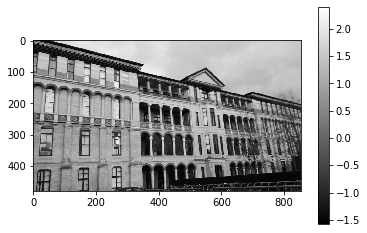

tensor([[9.2371e-07, 5.3770e-07, 1.5626e-06, 3.3184e-03],
        [7.8791e-07, 6.4559e-07, 2.9918e-06, 5.7427e-03],
        [1.4660e-06, 3.4429e-06, 7.6765e-07, 3.0145e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.14deg, Translation Error: 13.7cm

Uncertainty: tensor(0.0121)
Frame index: 122


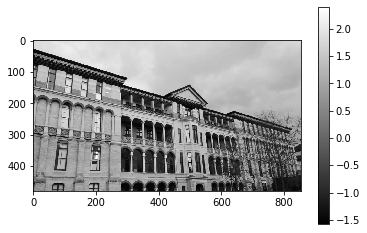

tensor([[7.9242e-07, 5.4322e-07, 1.1243e-06, 1.5938e-03],
        [7.2627e-07, 3.1167e-07, 1.5333e-06, 2.9020e-03],
        [1.3134e-06, 1.9487e-06, 9.0510e-07, 3.0110e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.24deg, Translation Error: 19.9cm

Uncertainty: tensor(0.0075)
Frame index: 123


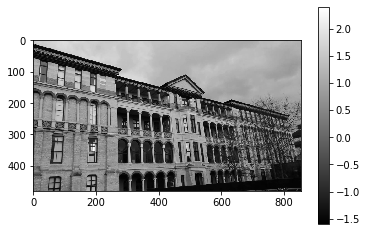

tensor([[1.0564e-06, 6.2579e-07, 1.4228e-06, 1.8510e-03],
        [9.1543e-07, 4.1459e-07, 2.4372e-06, 4.6143e-03],
        [1.3131e-06, 2.5496e-06, 1.2786e-06, 3.8614e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.23deg, Translation Error: 21.8cm

Uncertainty: tensor(0.0103)
Frame index: 124


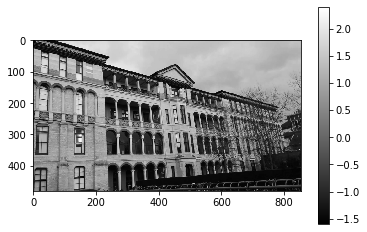

tensor([[6.1484e-07, 5.3694e-07, 9.9354e-07, 1.5071e-03],
        [9.7460e-07, 1.7557e-07, 1.1648e-06, 1.9761e-03],
        [9.7390e-07, 1.5481e-06, 6.7461e-07, 2.8644e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.75deg, Translation Error: 40.1cm

Uncertainty: tensor(0.0064)
Frame index: 125


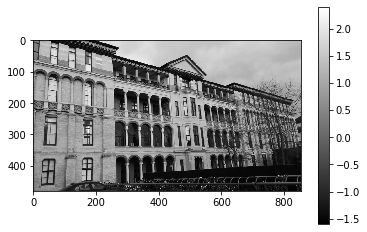

tensor([[3.5188e-07, 4.9931e-07, 4.9667e-07, 1.1811e-03],
        [4.7544e-07, 1.8987e-07, 1.3180e-06, 1.9371e-03],
        [4.7603e-07, 1.2783e-06, 4.1215e-07, 2.3088e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.74deg, Translation Error: 41.6cm

Uncertainty: tensor(0.0054)
Frame index: 126


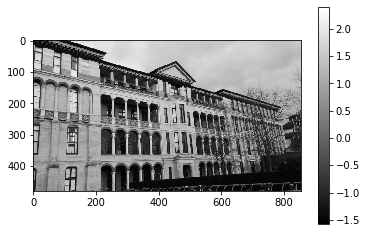

tensor([[5.1974e-07, 7.5596e-07, 8.0583e-07, 1.4460e-03],
        [1.1506e-06, 3.0998e-07, 2.2642e-06, 4.2005e-03],
        [7.1368e-07, 2.5138e-06, 8.8999e-07, 2.1596e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.73deg, Translation Error: 40.0cm

Uncertainty: tensor(0.0078)
Frame index: 127


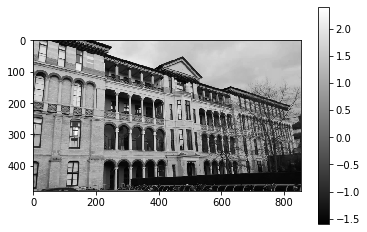

tensor([[4.5543e-07, 7.0435e-07, 6.2078e-07, 1.4446e-03],
        [7.1308e-07, 1.9879e-07, 1.8290e-06, 3.0378e-03],
        [5.9842e-07, 1.8228e-06, 4.4244e-07, 1.4252e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.52deg, Translation Error: 28.5cm

Uncertainty: tensor(0.0059)
Frame index: 128


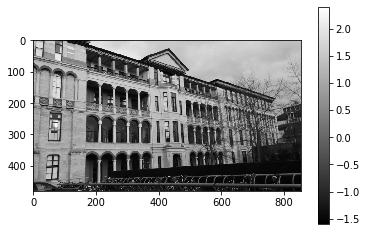

tensor([[3.0442e-07, 4.2409e-07, 4.1657e-07, 7.2913e-04],
        [4.7118e-07, 1.2210e-07, 1.2673e-06, 1.9702e-03],
        [4.1345e-07, 1.3147e-06, 3.9286e-07, 1.5917e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.21deg, Translation Error: 7.9cm

Uncertainty: tensor(0.0043)
Frame index: 129


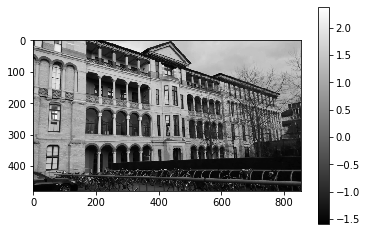

tensor([[4.6528e-07, 4.8502e-07, 5.3871e-07, 1.2647e-03],
        [8.6329e-07, 1.3466e-07, 2.3404e-06, 3.4305e-03],
        [6.1463e-07, 2.6937e-06, 3.7387e-07, 1.4674e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.41deg, Translation Error: 27.9cm

Uncertainty: tensor(0.0062)
Frame index: 130


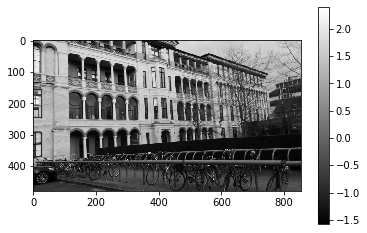

tensor([[7.1829e-07, 6.3535e-07, 7.8533e-07, 1.8574e-03],
        [1.5995e-06, 3.9989e-07, 3.3705e-06, 5.1093e-03],
        [9.8294e-07, 4.4973e-06, 5.5138e-07, 1.3665e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.23deg, Translation Error: 12.6cm

Uncertainty: tensor(0.0083)
Frame index: 131


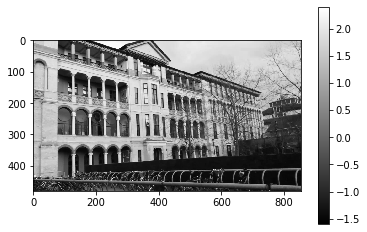

tensor([[4.5828e-07, 5.9349e-07, 5.3612e-07, 1.0145e-03],
        [6.6367e-07, 9.3333e-08, 1.1514e-06, 1.8000e-03],
        [5.1249e-07, 1.1854e-06, 5.8412e-07, 1.8985e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.10deg, Translation Error: 3.1cm

Uncertainty: tensor(0.0047)
Frame index: 132


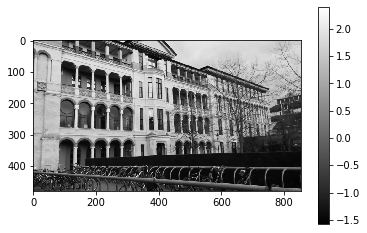

tensor([[8.3871e-07, 5.8032e-07, 1.1536e-06, 1.9270e-03],
        [9.1520e-07, 2.7251e-07, 2.8408e-06, 3.6310e-03],
        [1.1850e-06, 3.3024e-06, 7.4445e-07, 1.7254e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.17deg, Translation Error: 9.6cm

Uncertainty: tensor(0.0073)
Frame index: 133


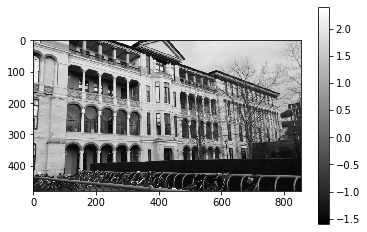

tensor([[5.7495e-07, 5.9349e-07, 9.6700e-07, 2.0613e-03],
        [6.3794e-07, 2.3383e-07, 2.3350e-06, 2.8614e-03],
        [8.9900e-07, 2.3839e-06, 6.1798e-07, 1.5297e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.37deg, Translation Error: 23.4cm

Uncertainty: tensor(0.0065)
Frame index: 134


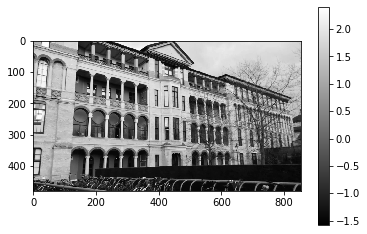

tensor([[5.1264e-07, 7.7080e-07, 7.9999e-07, 1.1650e-03],
        [7.5992e-07, 2.3103e-07, 1.8308e-06, 2.2596e-03],
        [7.4134e-07, 1.8046e-06, 6.6924e-07, 1.5085e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.44deg, Translation Error: 21.7cm

Uncertainty: tensor(0.0049)
Frame index: 135


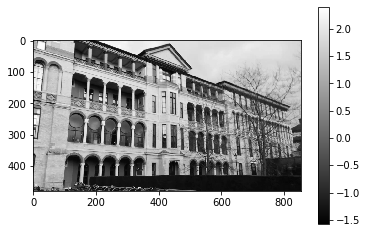

tensor([[4.8303e-07, 5.9080e-07, 7.3112e-07, 1.2018e-03],
        [7.6424e-07, 2.9974e-07, 2.1661e-06, 3.2087e-03],
        [6.9239e-07, 2.3693e-06, 6.0685e-07, 1.3666e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.14deg, Translation Error: 5.5cm

Uncertainty: tensor(0.0058)
Frame index: 136


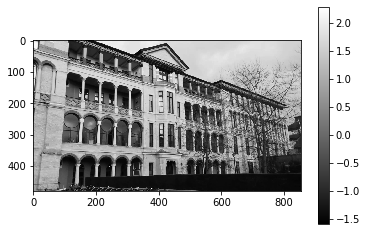

tensor([[6.4748e-07, 5.3399e-07, 8.9572e-07, 1.6867e-03],
        [4.6168e-07, 2.1182e-07, 1.6168e-06, 2.0050e-03],
        [9.0042e-07, 1.5855e-06, 7.0377e-07, 1.5871e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.36deg, Translation Error: 17.4cm

Uncertainty: tensor(0.0053)
Frame index: 137


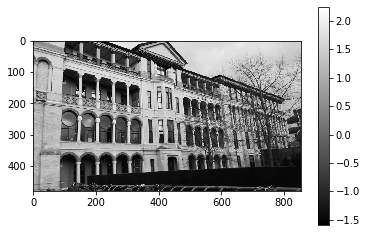

tensor([[5.1773e-07, 5.8673e-07, 7.9327e-07, 1.3236e-03],
        [5.9241e-07, 1.6295e-07, 1.1893e-06, 1.3495e-03],
        [8.0500e-07, 1.2152e-06, 6.6895e-07, 1.3100e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.50deg, Translation Error: 20.9cm

Uncertainty: tensor(0.0040)
Frame index: 138


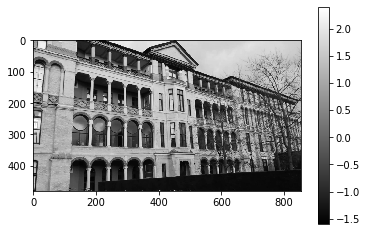

tensor([[6.4849e-07, 4.5709e-07, 7.1420e-07, 1.2847e-03],
        [6.0276e-07, 2.2194e-07, 1.2941e-06, 1.5420e-03],
        [7.0558e-07, 1.4044e-06, 8.2011e-07, 1.2635e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.34deg, Translation Error: 13.5cm

Uncertainty: tensor(0.0041)
Frame index: 139


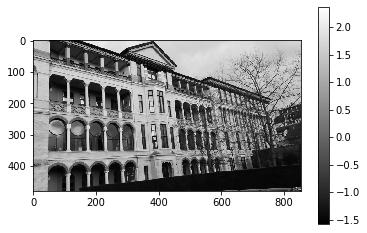

tensor([[8.3898e-07, 5.3700e-07, 9.3208e-07, 1.6312e-03],
        [6.3824e-07, 3.1072e-07, 1.5666e-06, 1.7568e-03],
        [9.4366e-07, 1.6966e-06, 7.8852e-07, 1.2466e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.28deg, Translation Error: 9.8cm

Uncertainty: tensor(0.0046)
Frame index: 140


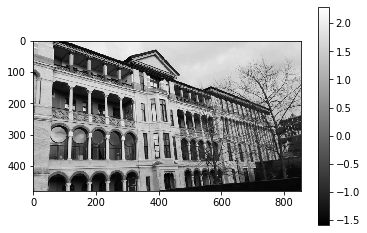

tensor([[5.5053e-07, 7.4847e-07, 5.5504e-07, 1.0524e-03],
        [7.4959e-07, 3.1254e-07, 1.7432e-06, 2.0221e-03],
        [5.1702e-07, 1.7274e-06, 6.8662e-07, 1.1297e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.27deg, Translation Error: 10.8cm

Uncertainty: tensor(0.0042)
Frame index: 141


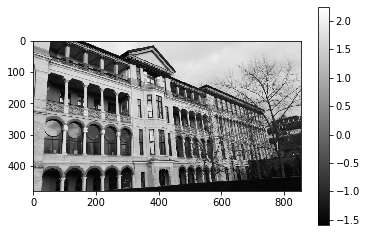

tensor([[3.3862e-07, 4.9045e-07, 3.6413e-07, 1.0154e-03],
        [7.1422e-07, 2.8886e-07, 1.3941e-06, 1.6511e-03],
        [3.4713e-07, 1.5970e-06, 6.2518e-07, 1.0833e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.13deg, Translation Error: 4.8cm

Uncertainty: tensor(0.0038)
Frame index: 142


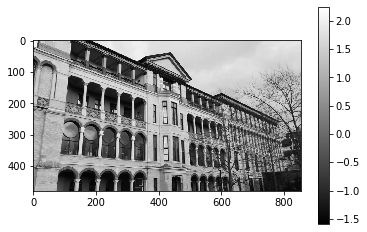

tensor([[2.5503e-07, 4.1529e-07, 2.1943e-07, 6.4224e-04],
        [9.7304e-07, 2.6566e-07, 1.0650e-06, 1.2445e-03],
        [2.6207e-07, 1.6181e-06, 5.7318e-07, 1.1695e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.32deg, Translation Error: 11.2cm

Uncertainty: tensor(0.0031)
Frame index: 143


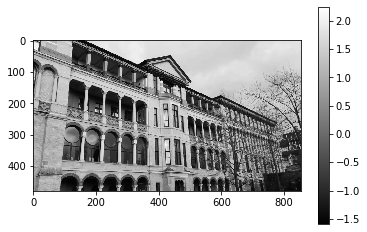

tensor([[7.4680e-07, 7.1145e-07, 7.7222e-07, 1.2254e-03],
        [8.1977e-07, 2.5463e-07, 1.1184e-06, 1.3534e-03],
        [6.8585e-07, 1.1332e-06, 8.4643e-07, 1.2105e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.07deg, Translation Error: 8.5cm

Uncertainty: tensor(0.0038)
Frame index: 144


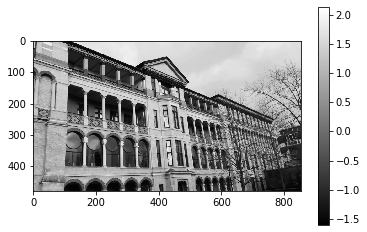

tensor([[4.5134e-07, 4.9381e-07, 3.7913e-07, 6.9172e-04],
        [7.3466e-07, 3.0090e-07, 1.2400e-06, 1.3997e-03],
        [3.5129e-07, 1.4553e-06, 6.5992e-07, 1.0797e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.23deg, Translation Error: 10.1cm

Uncertainty: tensor(0.0032)
Frame index: 145


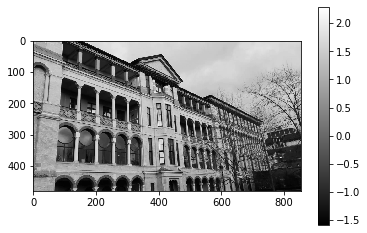

tensor([[5.3978e-07, 5.9896e-07, 5.6901e-07, 1.0132e-03],
        [8.7518e-07, 4.1783e-07, 1.3781e-06, 1.8424e-03],
        [5.3293e-07, 1.5857e-06, 6.4568e-07, 9.4824e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.20deg, Translation Error: 4.8cm

Uncertainty: tensor(0.0038)
Frame index: 146


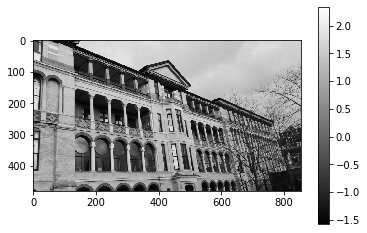

tensor([[8.5234e-07, 5.5276e-07, 8.5985e-07, 1.4211e-03],
        [1.0642e-06, 4.2431e-07, 1.3749e-06, 1.4037e-03],
        [8.3456e-07, 1.7497e-06, 1.1546e-06, 2.3878e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.20deg, Translation Error: 19.9cm

Uncertainty: tensor(0.0052)
Frame index: 147


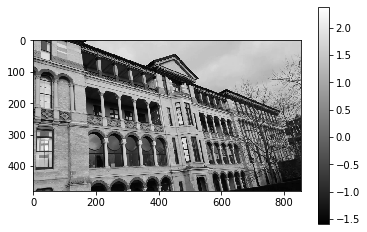

tensor([[6.3246e-07, 5.0546e-07, 5.8442e-07, 8.9262e-04],
        [7.0946e-07, 3.9479e-07, 1.2133e-06, 1.4677e-03],
        [6.5843e-07, 1.4892e-06, 6.3731e-07, 1.3329e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.04deg, Translation Error: 9.4cm

Uncertainty: tensor(0.0037)
Frame index: 148


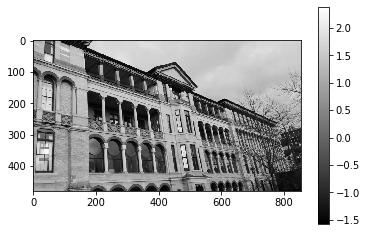

tensor([[3.4039e-07, 4.6125e-07, 3.8410e-07, 9.5417e-04],
        [9.2022e-07, 4.1577e-07, 1.3723e-06, 1.5755e-03],
        [2.8807e-07, 1.7275e-06, 5.7522e-07, 1.0324e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.21deg, Translation Error: 10.8cm

Uncertainty: tensor(0.0036)
Frame index: 149


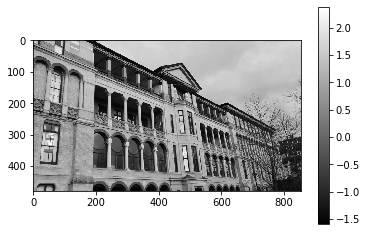

tensor([[7.5355e-07, 5.0274e-07, 5.4837e-07, 1.4793e-03],
        [1.1364e-06, 3.3235e-07, 1.2993e-06, 1.3740e-03],
        [5.8347e-07, 1.9731e-06, 9.5768e-07, 1.5683e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.10deg, Translation Error: 7.6cm

Uncertainty: tensor(0.0044)
Frame index: 150


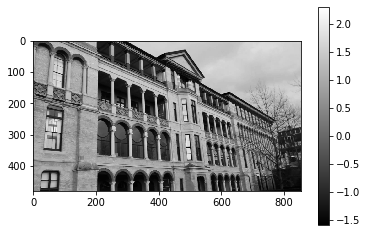

tensor([[6.9228e-07, 5.3583e-07, 6.8930e-07, 1.1826e-03],
        [6.9941e-07, 3.0468e-07, 1.3386e-06, 1.4092e-03],
        [6.8583e-07, 1.4863e-06, 6.3438e-07, 1.2943e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.38deg, Translation Error: 18.6cm

Uncertainty: tensor(0.0039)
Frame index: 151


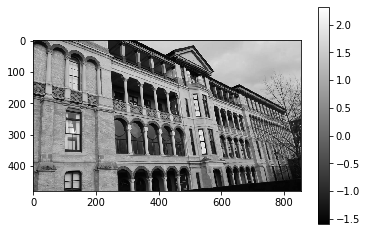

tensor([[4.0351e-07, 4.3389e-07, 3.1066e-07, 1.0878e-03],
        [8.5478e-07, 4.1309e-07, 1.2926e-06, 1.0115e-03],
        [3.8764e-07, 1.7794e-06, 9.4345e-07, 1.5978e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.34deg, Translation Error: 14.7cm

Uncertainty: tensor(0.0037)
Frame index: 152


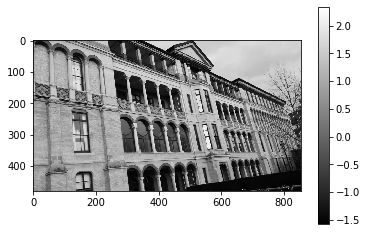

tensor([[4.1058e-07, 4.9820e-07, 2.7487e-07, 1.5005e-03],
        [8.8344e-07, 3.4223e-07, 1.1840e-06, 9.3630e-04],
        [3.4647e-07, 1.6484e-06, 5.6603e-07, 1.0371e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.23deg, Translation Error: 5.5cm

Uncertainty: tensor(0.0035)
Frame index: 153


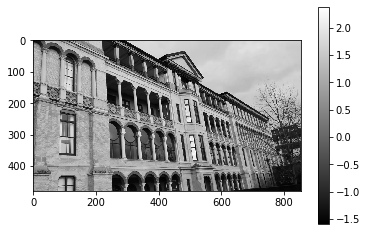

tensor([[6.7690e-07, 6.3069e-07, 5.5893e-07, 1.3844e-03],
        [8.2727e-07, 3.2361e-07, 1.4214e-06, 1.7470e-03],
        [4.4032e-07, 1.5150e-06, 8.5531e-07, 1.4559e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.27deg, Translation Error: 8.4cm

Uncertainty: tensor(0.0046)
Frame index: 154


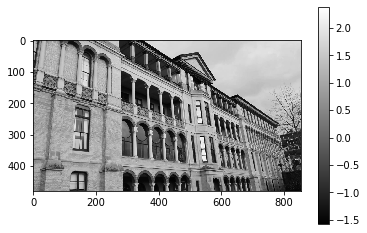

tensor([[5.0345e-07, 4.8693e-07, 3.5340e-07, 1.0683e-03],
        [8.6396e-07, 2.8584e-07, 1.1540e-06, 1.2010e-03],
        [3.0254e-07, 1.4852e-06, 7.2158e-07, 1.0618e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.24deg, Translation Error: 13.4cm

Uncertainty: tensor(0.0033)
Frame index: 155


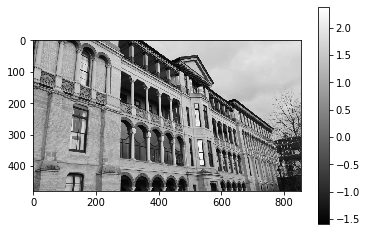

tensor([[6.2229e-07, 6.3705e-07, 3.5074e-07, 1.3800e-03],
        [8.5421e-07, 3.0606e-07, 1.4014e-06, 1.4238e-03],
        [3.2662e-07, 1.7133e-06, 5.9709e-07, 8.9867e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.20deg, Translation Error: 19.9cm

Uncertainty: tensor(0.0037)
Frame index: 156


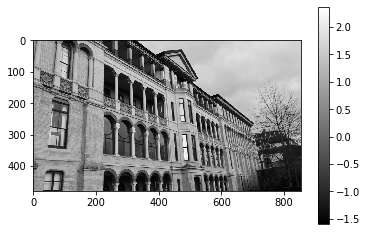

tensor([[5.6206e-07, 8.1454e-07, 3.3896e-07, 1.3206e-03],
        [9.4090e-07, 3.0846e-07, 1.3214e-06, 1.2003e-03],
        [2.0535e-07, 1.3190e-06, 6.8503e-07, 1.1413e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.35deg, Translation Error: 11.6cm

Uncertainty: tensor(0.0037)
Frame index: 157


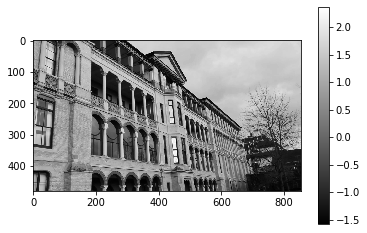

tensor([[8.5603e-07, 6.6835e-07, 2.8888e-07, 9.6480e-04],
        [1.4846e-06, 3.5759e-07, 1.2930e-06, 1.3061e-03],
        [2.7595e-07, 2.1111e-06, 9.9472e-07, 1.2314e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.17deg, Translation Error: 16.6cm

Uncertainty: tensor(0.0035)
Frame index: 158


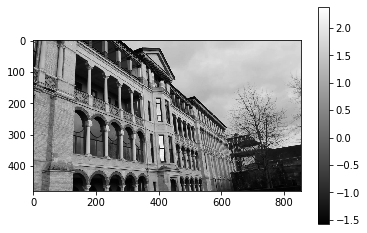

tensor([[9.0501e-07, 4.4940e-07, 3.2129e-07, 8.8455e-04],
        [1.1895e-06, 2.9572e-07, 9.8056e-07, 1.1459e-03],
        [2.8060e-07, 1.7471e-06, 9.0996e-07, 1.0436e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.29deg, Translation Error: 13.3cm

Uncertainty: tensor(0.0031)
Frame index: 159


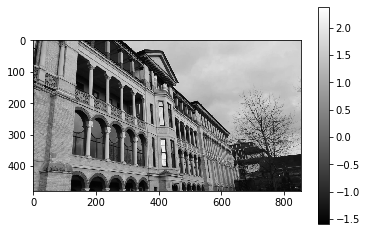

tensor([[5.4389e-07, 6.9283e-07, 2.4585e-07, 6.3781e-04],
        [1.3478e-06, 2.8200e-07, 1.0998e-06, 9.7431e-04],
        [1.1588e-07, 1.5195e-06, 8.4654e-07, 1.1712e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.22deg, Translation Error: 1.2cm

Uncertainty: tensor(0.0028)
Frame index: 160


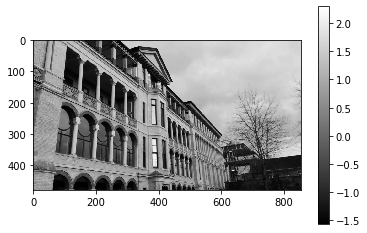

tensor([[1.5892e-06, 5.3818e-07, 4.5874e-07, 1.7046e-03],
        [1.5123e-06, 3.3183e-07, 9.1881e-07, 8.9180e-04],
        [4.1518e-07, 1.8247e-06, 1.7600e-06, 1.6776e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.12deg, Translation Error: 5.4cm

Uncertainty: tensor(0.0043)
Frame index: 161


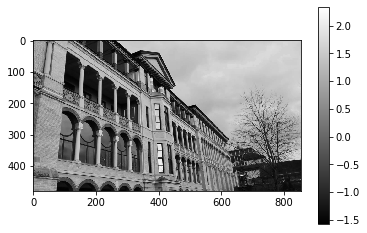

tensor([[1.0908e-06, 4.2463e-07, 4.2391e-07, 1.0543e-03],
        [1.0609e-06, 1.8658e-07, 7.2946e-07, 8.7962e-04],
        [2.3961e-07, 1.1327e-06, 1.1213e-06, 9.7797e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.15deg, Translation Error: 2.2cm

Uncertainty: tensor(0.0029)
Frame index: 162


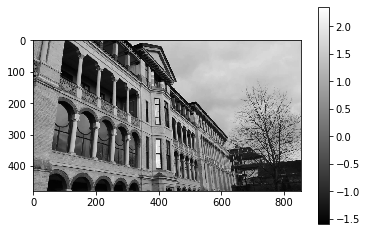

tensor([[6.7201e-07, 3.7224e-07, 3.0459e-07, 9.7284e-04],
        [1.3970e-06, 3.3581e-07, 8.6028e-07, 6.1720e-04],
        [2.2302e-07, 1.8557e-06, 7.4908e-07, 7.5302e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.27deg, Translation Error: 6.6cm

Uncertainty: tensor(0.0023)
Frame index: 163


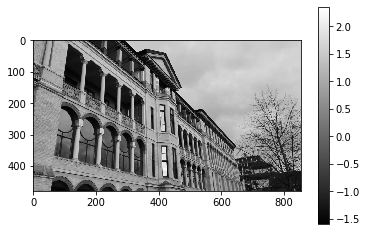

tensor([[4.6798e-07, 5.9554e-07, 2.6928e-07, 1.1141e-03],
        [1.6192e-06, 3.5748e-07, 1.2044e-06, 8.0096e-04],
        [1.5509e-07, 1.9428e-06, 9.7376e-07, 1.2325e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.21deg, Translation Error: 11.5cm

Uncertainty: tensor(0.0032)
Frame index: 164


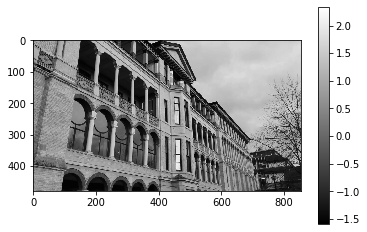

tensor([[6.7094e-07, 5.5269e-07, 3.8801e-07, 7.8812e-04],
        [1.2006e-06, 3.3991e-07, 1.1100e-06, 7.5828e-04],
        [2.5108e-07, 1.6896e-06, 7.8841e-07, 8.9520e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.25deg, Translation Error: 4.9cm

Uncertainty: tensor(0.0024)
Frame index: 165


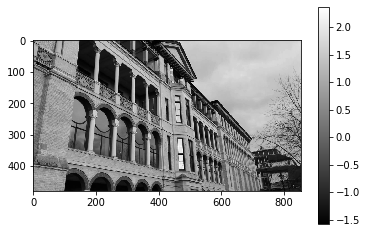

tensor([[7.0410e-07, 8.0523e-07, 5.2722e-07, 1.2791e-03],
        [2.5512e-06, 3.7601e-07, 1.3221e-06, 8.4058e-04],
        [3.3730e-07, 2.7636e-06, 1.0734e-06, 1.4727e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.27deg, Translation Error: 15.1cm

Uncertainty: tensor(0.0036)
Frame index: 166


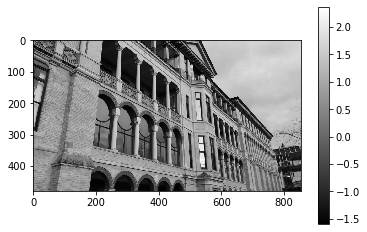

tensor([[6.5648e-07, 8.0832e-07, 4.4550e-07, 1.1625e-03],
        [1.1434e-06, 3.3303e-07, 1.2562e-06, 6.7898e-04],
        [2.2732e-07, 1.4648e-06, 5.7855e-07, 8.1062e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.23deg, Translation Error: 14.6cm

Uncertainty: tensor(0.0027)
Frame index: 167


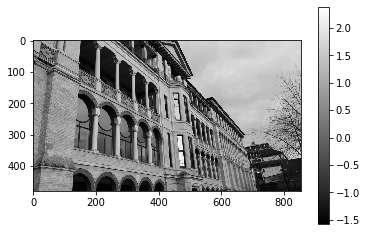

tensor([[8.3933e-07, 6.8706e-07, 4.2464e-07, 1.2900e-03],
        [1.1357e-06, 3.8511e-07, 1.1518e-06, 8.3265e-04],
        [2.7579e-07, 1.4317e-06, 1.1517e-06, 1.5344e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.26deg, Translation Error: 20.8cm

Uncertainty: tensor(0.0037)
Frame index: 168


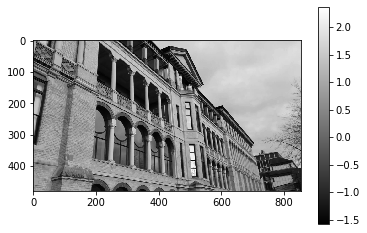

tensor([[6.0462e-07, 6.4369e-07, 2.6890e-07, 7.3312e-04],
        [1.1470e-06, 2.9486e-07, 1.0655e-06, 8.3457e-04],
        [2.2052e-07, 1.6294e-06, 6.0348e-07, 4.4968e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.70deg, Translation Error: 17.8cm

Uncertainty: tensor(0.0020)
Frame index: 169


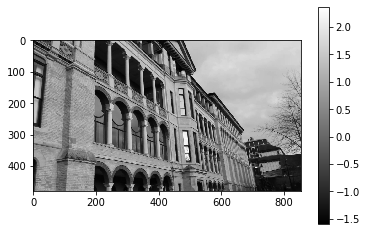

tensor([[5.7281e-07, 5.9957e-07, 1.9203e-07, 8.8917e-04],
        [1.4611e-06, 3.1601e-07, 1.0959e-06, 9.4718e-04],
        [2.2381e-07, 2.0369e-06, 6.6735e-07, 6.0892e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.36deg, Translation Error: 15.3cm

Uncertainty: tensor(0.0025)
Frame index: 170


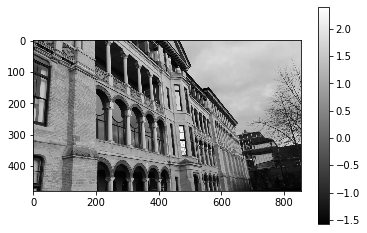

tensor([[1.1637e-06, 6.1534e-07, 2.2325e-07, 2.2747e-03],
        [3.4341e-06, 3.2430e-07, 1.2212e-06, 9.0968e-04],
        [3.8744e-07, 4.5080e-06, 7.8582e-07, 9.9848e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.28deg, Translation Error: 7.4cm

Uncertainty: tensor(0.0042)
Frame index: 171


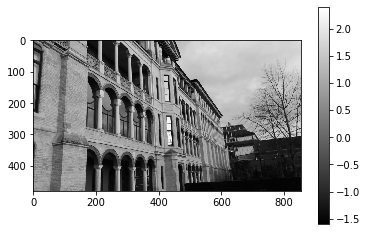

tensor([[1.3343e-06, 6.1779e-07, 3.6169e-07, 1.3688e-03],
        [2.2716e-06, 3.4336e-07, 1.2934e-06, 9.2117e-04],
        [3.0341e-07, 3.2328e-06, 8.5159e-07, 9.1862e-04],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.34deg, Translation Error: 14.5cm

Uncertainty: tensor(0.0032)
Frame index: 172


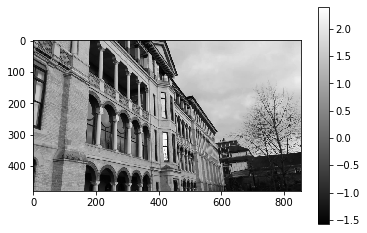

tensor([[1.1601e-06, 8.0712e-07, 2.5767e-07, 9.2303e-04],
        [2.1638e-06, 2.4125e-07, 1.1857e-06, 1.0721e-03],
        [1.7059e-07, 2.5271e-06, 1.0692e-06, 1.1698e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.30deg, Translation Error: 12.6cm

Uncertainty: tensor(0.0032)
Frame index: 173


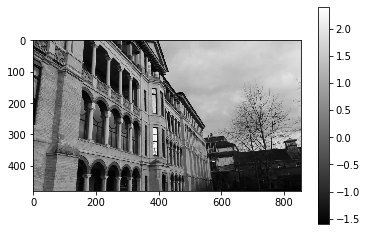

tensor([[8.0174e-07, 7.4897e-07, 2.0677e-07, 3.5133e-03],
        [1.5769e-06, 2.5768e-07, 1.2019e-06, 7.9496e-04],
        [1.6157e-07, 2.0640e-06, 8.5564e-07, 1.1471e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.43deg, Translation Error: 19.9cm

Uncertainty: tensor(0.0055)
Frame index: 174


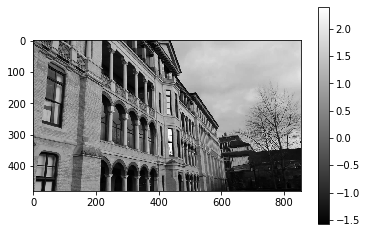

tensor([[1.8197e-06, 1.1113e-06, 4.8860e-07, 2.3219e-03],
        [2.2077e-06, 4.0179e-07, 2.2540e-06, 1.9854e-03],
        [3.9947e-07, 3.5501e-06, 1.1533e-06, 1.5157e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.29deg, Translation Error: 3.1cm

Uncertainty: tensor(0.0058)
Frame index: 175


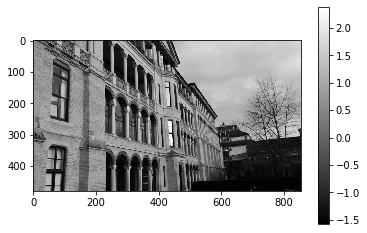

tensor([[1.6099e-06, 7.8280e-07, 5.5946e-07, 4.7152e-03],
        [1.6299e-06, 2.3945e-07, 1.2033e-06, 1.1538e-03],
        [2.3777e-07, 1.5102e-06, 1.6815e-06, 1.7425e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.36deg, Translation Error: 19.7cm

Uncertainty: tensor(0.0076)
Frame index: 176


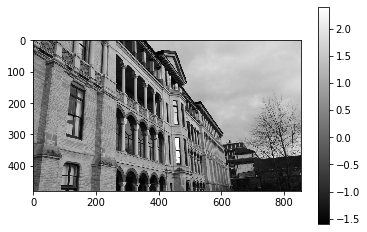

tensor([[1.4420e-06, 7.5185e-07, 3.3428e-07, 4.5004e-03],
        [3.2580e-06, 4.2737e-07, 1.4015e-06, 1.3632e-03],
        [3.8888e-07, 4.1288e-06, 1.0767e-06, 1.3035e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.31deg, Translation Error: 20.7cm

Uncertainty: tensor(0.0072)
Frame index: 177


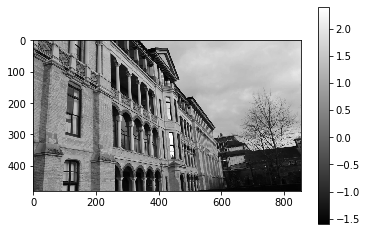

tensor([[1.2555e-06, 1.1763e-06, 4.9795e-07, 5.3338e-03],
        [3.0559e-06, 4.9189e-07, 1.8580e-06, 1.5280e-03],
        [2.7255e-07, 3.1137e-06, 1.4935e-06, 3.1322e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.34deg, Translation Error: 23.0cm

Uncertainty: tensor(0.0100)
Frame index: 178


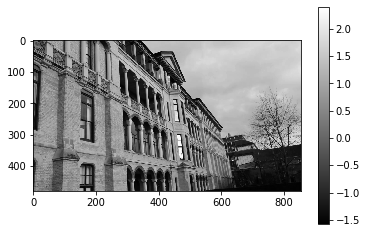

tensor([[2.8662e-06, 1.1875e-06, 5.7164e-07, 6.8021e-03],
        [2.7711e-06, 4.8104e-07, 2.4516e-06, 2.5760e-03],
        [4.9668e-07, 4.4199e-06, 1.6421e-06, 1.6530e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.46deg, Translation Error: 34.5cm

Uncertainty: tensor(0.0110)
Frame index: 179


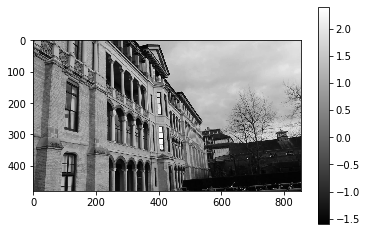

tensor([[2.1200e-06, 7.2153e-07, 3.4884e-07, 4.5003e-03],
        [3.2788e-06, 4.8868e-07, 1.7228e-06, 1.6027e-03],
        [4.3959e-07, 4.5051e-06, 1.2922e-06, 1.7491e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.36deg, Translation Error: 18.5cm

Uncertainty: tensor(0.0079)
Frame index: 180


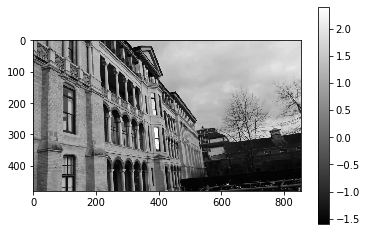

tensor([[1.7859e-06, 9.0136e-07, 4.0750e-07, 3.9565e-03],
        [2.4185e-06, 3.6374e-07, 1.8885e-06, 1.7452e-03],
        [3.2126e-07, 3.5246e-06, 1.3055e-06, 1.9717e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.57deg, Translation Error: 35.0cm

Uncertainty: tensor(0.0077)
Frame index: 181


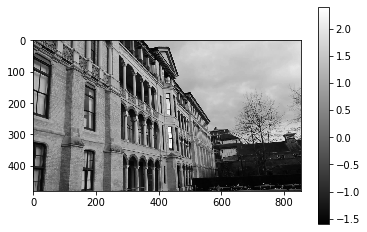

tensor([[1.6445e-06, 1.8440e-06, 7.0343e-07, 3.1239e-03],
        [5.2839e-06, 4.5424e-07, 3.1772e-06, 2.9906e-03],
        [2.2957e-07, 6.2163e-06, 1.6188e-06, 2.9022e-03],
        [0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00]])

Rotation Error: 0.22deg, Translation Error: 29.2cm

Uncertainty: tensor(0.0090)
Frame index: 182


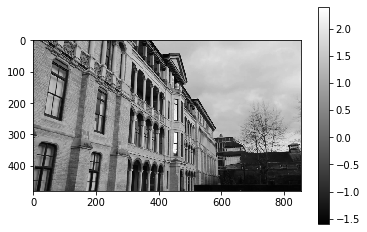



Test complete.

Accuracy:

5cm5deg: 56.0%
2cm2deg: 0.0%
1cm1deg: 0.0%

Median Error: 0.4deg, 20.8cm
Avg. processing time: 37109.1ms


In [8]:
if opt.mode < 2: opt.mode = 0 # we do not load ground truth scene coordinates when testing
testset = CamLocDataset("C:/Users/61450/Desktop/python course/Relocalization/dsacstar-master/datasets/" + opt.scene + "/test", mode = opt.mode)
testset_loader = torch.utils.data.DataLoader(testset, shuffle=False, num_workers=6)
network.eval()
print('Test images found: ', len(testset))
# keep track of rotation and translation errors for calculation of the median error
rErrs = []
tErrs = []
avg_time = 0

pct5 = 0
pct2 = 0
pct1 = 0
iter=1
with torch.no_grad():
    for image, gt_pose, init, focal_length, file in testset_loader:
        focal_length = float(focal_length[0])
        file = file[0].split('/')[-1] # remove path from file name
        gt_pose = gt_pose[0]
        image = image.to(device)

        start_time = time.time()

        # predict scene coordinates and neural guidance
        num_samples=50
        sampled_models = [guide(None, None) for _ in range(num_samples)]
        posehat= [net(image,focal_length,opt).data for net in sampled_models]
        posehats = posehat
        mean_posehats = torch.mean(torch.stack(posehats), 0)
        var_posehats = torch.var(torch.stack(posehats), 0)
        print(var_posehats)
        avg_time += time.time()-start_time
        t_err = float(torch.norm(gt_pose[0:3, 3] - mean_posehats[0:3, 3]))

        gt_R = gt_pose[0:3,0:3].numpy()
        out_R = mean_posehats[0:3,0:3].numpy()

        r_err = np.matmul(out_R, np.transpose(gt_R))
        r_err = cv2.Rodrigues(r_err)[0]
        r_err = np.linalg.norm(r_err) * 180 / math.pi

        print("\nRotation Error: %.2fdeg, Translation Error: %.1fcm" % (r_err, t_err*100))
        print("\nUncertainty:",torch.sum(var_posehats) )
        plt.figure()
        imgplot = plt.imshow(image[0,0,:,:],cmap='gray')
        plt.colorbar()
        print('Frame index:',iter)
        iter+=1
        plt.show()

        rErrs.append(r_err)
        tErrs.append(t_err * 100)
#Outdoor translation error accuracy (within 0.5% threshold) STMaryChurch: 35cm, GreatCourt: 45cm, Old Hospital: 22cm, King's College: 38 cm, Shop: 15cm
        if t_err<0.22:
            pct5+=1
# #indoor accuracy
#         if r_err < 5 and t_err < 0.05:
#             pct5 += 1
#         if r_err < 2 and t_err < 0.02:
#             pct2 += 1
#         if r_err < 1 and t_err < 0.01:
#                 pct1 += 1

        # write estimated pose to pose file
        mean_posehats = mean_posehats.inverse()

        t = mean_posehats[0:3, 3]

        # rotation to axis angle
        rot, _ = cv2.Rodrigues(mean_posehats[0:3,0:3].numpy())
        angle = np.linalg.norm(rot)
        axis = rot / angle

        # axis angle to quaternion
        q_w = math.cos(angle * 0.5)
        q_xyz = math.sin(angle * 0.5) * axis
median_idx = int(len(rErrs)/2)
tErrs.sort()
rErrs.sort()
avg_time /= len(rErrs)

print("\n===================================================")
print("\nTest complete.")

print('\nAccuracy:')
print('\n5cm5deg: %.1f%%' %(pct5 / len(rErrs) * 100))
print('2cm2deg: %.1f%%' % (pct2 / len(rErrs) * 100))
print('1cm1deg: %.1f%%' % (pct1 / len(rErrs) * 100))

print("\nMedian Error: %.1fdeg, %.1fcm" % (rErrs[median_idx], tErrs[median_idx]))
print("Avg. processing time: %4.1fms" % (avg_time * 1000))